#  Insect Classification — End-to-End Deep Learning Pipeline
### 6CS012 Final Portfolio Project 2026
---
**Dataset:** Insect Classification (9 classes)  
**Framework:** Keras (TensorFlow backend)  
**Structure:** Part A — CNN from Scratch | Part B — Transfer Learning

## 0. Environment Setup & Imports

In [1]:
!pip install gradio --upgrade -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.7/19.7 MB 83.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.0/60.0 kB 4.5 MB/s eta 0:00:00


In [2]:
import os, shutil, time, warnings
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
warnings.filterwarnings('ignore')

from sklearn.metrics import (
    classification_report, confusion_matrix,
    accuracy_score, precision_score, recall_score, f1_score
)

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.applications import VGG16
from tensorflow.keras.optimizers import Adam, SGD

print(f"TensorFlow version : {tf.__version__}")
print(f"Keras version      : {keras.__version__}")
print(f"GPUs available     : {tf.config.list_physical_devices('GPU')}")

# Reproducibility
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)

2026-05-10 07:18:12.298700: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1778397492.501037      57 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1778397492.564279      57 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1778397493.058195      57 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1778397493.058230      57 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1778397493.058233      57 computation_placer.cc:177] computation placer alr

TensorFlow version : 2.19.0
Keras version      : 3.10.0
GPUs available     : [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]


## 1. Dataset Transfer to Working Directory

In [3]:
SRC_BASE = "/kaggle/input/datasets/omkarpoudel06/insect-classification-20260417t174825z-3-001-zip/Insect Classification"
DST_BASE = "/kaggle/working/insect_dataset"

if not os.path.exists(DST_BASE):
    print("Copying dataset...")
    shutil.copytree(SRC_BASE, DST_BASE)
    print("Copy complete ✔")
else:
    print("Already copied ✔")

print("New base:", DST_BASE)

Copying dataset...
Copy complete ✔
New base: /kaggle/working/insect_dataset


In [4]:
BASE_DIR  = DST_BASE
TRAIN_DIR = os.path.join(BASE_DIR, "train")
TEST_DIR  = os.path.join(BASE_DIR, "test")

for path, name in [(TRAIN_DIR, 'Train'), (TEST_DIR, 'Test')]:
    print(f"{name} exists: {os.path.exists(path)} -> {path}")

Train exists: True -> /kaggle/working/insect_dataset/train
Test exists: True -> /kaggle/working/insect_dataset/test


In [5]:

# ── Discover class names and image counts ──────────────────────────────────
CLASS_NAMES = sorted(os.listdir(TRAIN_DIR))
NUM_CLASSES = len(CLASS_NAMES)
print(f"Number of classes : {NUM_CLASSES}")
print(f"Class names       : {CLASS_NAMES}")
train_counts = {cls: len(os.listdir(os.path.join(TRAIN_DIR, cls))) for cls in CLASS_NAMES}
test_counts  = {cls: len(os.listdir(os.path.join(TEST_DIR,  cls))) for cls in CLASS_NAMES}
total_train = sum(train_counts.values())
total_test  = sum(test_counts.values())
total_imgs  = total_train + total_test
print(f"\nTotal training images   : {total_train}")
print(f"Total test images       : {total_test}")
print(f"Total images (all)      : {total_imgs}")
print(f"Train / Test split      : {total_train/total_imgs*100:.1f}% / {total_test/total_imgs*100:.1f}%")

Number of classes : 9
Class names       : ['aphids', 'armyworm', 'beetle', 'bollworm', 'grasshopper', 'mites', 'mosquito', 'sawfly', 'stem_borer']

Total training images   : 2232
Total test images       : 384
Total images (all)      : 2616
Train / Test split      : 85.3% / 14.7%


---
# PART A — CNN from Scratch
---
## 2. Data Understanding, Analysis, Visualization & Cleaning

In [6]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

# ── Compute class weights using your existing variables ────────────────────
train_labels = []
for cls_idx, cls_name in enumerate(CLASS_NAMES):
    count = train_counts[cls_name]
    train_labels.extend([cls_idx] * count)

train_labels = np.array(train_labels)

class_weights = compute_class_weight(
    class_weight = 'balanced',
    classes      = np.arange(NUM_CLASSES),
    y            = train_labels
)

class_weight_dict = dict(enumerate(class_weights))

# ── Print to verify ────────────────────────────────────────────────────────
print("Class Weights:")
for idx, cls_name in enumerate(CLASS_NAMES):
    print(f"  {cls_name:<20} → {class_weight_dict[idx]:.4f}")

Class Weights:
  aphids               → 0.9323
  armyworm             → 1.1121
  beetle               → 0.8522
  bollworm             → 1.0122
  grasshopper          → 0.8953
  mites                → 0.9764
  mosquito             → 0.8407
  sawfly               → 1.2400
  stem_borer           → 1.3702


In [7]:
import os
from PIL import Image, UnidentifiedImageError

# ── Clean dataset + convert RGBA → RGB ─────────────────────────────────────
removed_count = 0
converted_count = 0
checked_count = 0

VALID_EXTENSIONS = ('.jpg', '.jpeg', '.png', '.bmp', '.webp')

for root, _, files in os.walk(DST_BASE):
    for fname in files:

        # Skip non-image files
        if not fname.lower().endswith(VALID_EXTENSIONS):
            continue

        fpath = os.path.join(root, fname)
        checked_count += 1

        try:
            # Open image
            with Image.open(fpath) as img:

                # Force full decoding (detect corruption)
                img.load()

                # ── Convert RGBA / LA / P → RGB ─────────────────
                if img.mode in ("RGBA", "LA", "P"):
                    rgb_img = Image.new("RGB", img.size, (255, 255, 255))
                    rgb_img.paste(img, mask=img.split()[-1] if img.mode == "RGBA" else None)

                    # Overwrite original image
                    rgb_img.save(fpath)

                    converted_count += 1
                    print(f"[CONVERTED RGBA→RGB] {fpath}")

                # Optional: convert grayscale → RGB
                elif img.mode != "RGB":
                    rgb_img = img.convert("RGB")
                    rgb_img.save(fpath)

                    converted_count += 1
                    print(f"[CONVERTED {img.mode}→RGB] {fpath}")

        except (UnidentifiedImageError, OSError, IOError) as e:

            os.remove(fpath)
            removed_count += 1

print("─" * 60)
print(f"Checked images   : {checked_count}")
print(f"Converted to RGB : {converted_count}")
print(f"Removed corrupt  : {removed_count}")
print("Dataset cleaning complete ✔")

[CONVERTED RGBA→RGB] /kaggle/working/insect_dataset/train/armyworm/jpg_79 - Copy (2).jpg
[CONVERTED RGBA→RGB] /kaggle/working/insect_dataset/train/armyworm/jpg_79 - Copy (3) - Copy.jpg
[CONVERTED RGBA→RGB] /kaggle/working/insect_dataset/train/armyworm/jpg_79 - Copy (2) - Copy.jpg
[CONVERTED RGBA→RGB] /kaggle/working/insect_dataset/train/armyworm/jpg_79 - Copy (3).jpg
[CONVERTED RGBA→RGB] /kaggle/working/insect_dataset/train/armyworm/jpg_79 - Copy.jpg
[CONVERTED RGBA→RGB] /kaggle/working/insect_dataset/train/armyworm/jpg_79.jpg
[CONVERTED RGBA→RGB] /kaggle/working/insect_dataset/train/bollworm/jpg_21 - Copy (3).jpg
[CONVERTED RGBA→RGB] /kaggle/working/insect_dataset/train/bollworm/jpg_21 - Copy.jpg
[CONVERTED RGBA→RGB] /kaggle/working/insect_dataset/train/bollworm/jpg_38 - Copy (3).jpg
[CONVERTED RGBA→RGB] /kaggle/working/insect_dataset/train/bollworm/jpg_38 - Copy.jpg
[CONVERTED RGBA→RGB] /kaggle/working/insect_dataset/train/bollworm/jpg_21 - Copy (2).jpg
[CONVERTED RGBA→RGB] /kaggle/w

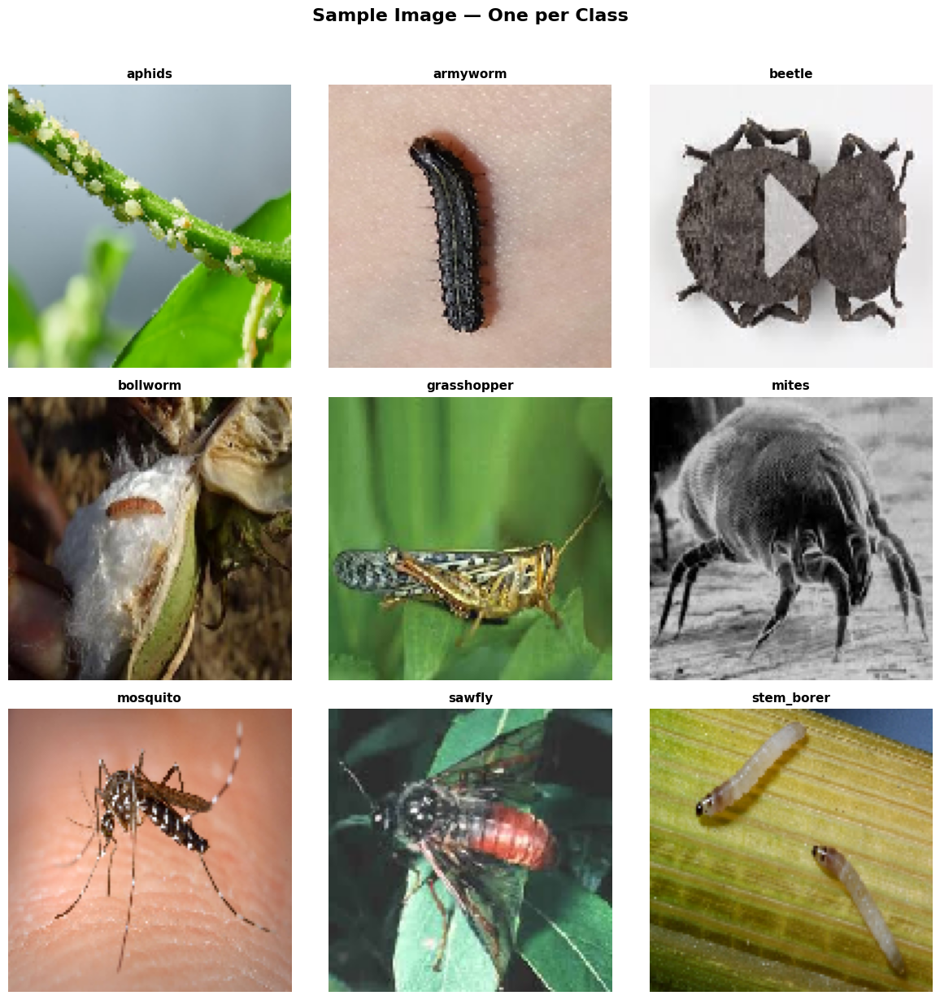

In [8]:
# ── Visualise sample images from each class ────────────────────────────────
from tensorflow.keras.preprocessing import image as kimage

fig, axes = plt.subplots(3, 3, figsize=(12, 12))
fig.suptitle('Sample Image — One per Class', fontsize=16, fontweight='bold', y=1.02)

for ax, cls in zip(axes.ravel(), CLASS_NAMES):
    cls_dir = os.path.join(TRAIN_DIR, cls)
    sample_file = os.path.join(cls_dir, os.listdir(cls_dir)[0])
    img = kimage.load_img(sample_file, target_size=(128, 128))
    ax.imshow(img)
    ax.set_title(cls, fontsize=11, fontweight='bold')
    ax.axis('off')

plt.tight_layout()
plt.savefig('sample_images.png', dpi=150, bbox_inches='tight')
plt.show()

### 2.1 Preprocessing & Data Generators

In [9]:
# ── Hyperparameters ────────────────────────────────────────────────────────
IMG_SIZE   = (128, 128)   # resize target
BATCH_SIZE = 32
EPOCHS_A   = 30           # Part A baseline & deeper

# ── Training generator — with augmentation ─────────────────────────────────
train_datagen = ImageDataGenerator(
    rescale=1./255,

    # Geometric transforms
    rotation_range=20,
    width_shift_range=0.15,
    height_shift_range=0.15,
    zoom_range=0.15,
    shear_range=0.1,

    # Flips
    horizontal_flip=True,
    vertical_flip=False,

    # Lighting
    brightness_range=[0.85, 1.15],

    # Border handling
    fill_mode='nearest',

    # Split
    validation_split=0.2
)

# ── Test / validation generator — NO augmentation ─────────────────────────
val_test_datagen = ImageDataGenerator(
    rescale          = 1./255,
    validation_split = 0.2
)

train_gen = train_datagen.flow_from_directory(
    TRAIN_DIR, target_size=IMG_SIZE, batch_size=BATCH_SIZE,
    class_mode='categorical', subset='training', seed=SEED
)
val_gen = val_test_datagen.flow_from_directory(
    TRAIN_DIR, target_size=IMG_SIZE, batch_size=BATCH_SIZE,
    class_mode='categorical', subset='validation', seed=SEED, shuffle=False
)
test_gen = ImageDataGenerator(rescale=1./255).flow_from_directory(
    TEST_DIR, target_size=IMG_SIZE, batch_size=BATCH_SIZE,
    class_mode='categorical', shuffle=False
)

CLASS_MAP   = {v: k for k, v in train_gen.class_indices.items()}
STEPS_TRAIN = train_gen.samples // BATCH_SIZE
STEPS_VAL   = val_gen.samples   // BATCH_SIZE

print(f"Train samples : {train_gen.samples}")
print(f"Val samples   : {val_gen.samples}")
print(f"Test samples  : {test_gen.samples}")
print(f"Class map     : {CLASS_MAP}")

Found 1692 images belonging to 9 classes.
Found 419 images belonging to 9 classes.
Found 384 images belonging to 9 classes.
Train samples : 1692
Val samples   : 419
Test samples  : 384
Class map     : {0: 'aphids', 1: 'armyworm', 2: 'beetle', 3: 'bollworm', 4: 'grasshopper', 5: 'mites', 6: 'mosquito', 7: 'sawfly', 8: 'stem_borer'}


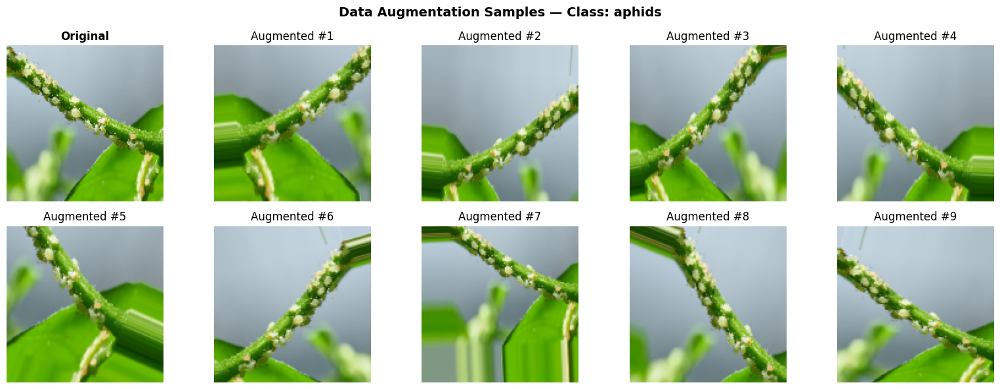

In [10]:
# ── Visualise augmented images ─────────────────────────────────────────────
aug_datagen = ImageDataGenerator(
    rescale=1./255, rotation_range=25, width_shift_range=0.2,
    height_shift_range=0.2, shear_range=0.15, zoom_range=0.2,
    horizontal_flip=True, fill_mode='nearest'
)

# Pick one image from the first class
first_cls = CLASS_NAMES[0]
sample_path = os.path.join(TRAIN_DIR, first_cls, os.listdir(os.path.join(TRAIN_DIR, first_cls))[0])
sample_img  = kimage.load_img(sample_path, target_size=IMG_SIZE)
sample_arr  = kimage.img_to_array(sample_img)
sample_arr  = sample_arr.reshape((1,) + sample_arr.shape)

fig, axes = plt.subplots(2, 5, figsize=(16, 6))
fig.suptitle(f'Data Augmentation Samples — Class: {first_cls}', fontsize=14, fontweight='bold')

axes[0][0].imshow(sample_img)
axes[0][0].set_title('Original', fontweight='bold')
axes[0][0].axis('off')

aug_gen = aug_datagen.flow(sample_arr, batch_size=1)
for i, ax in enumerate(axes.ravel()[1:]):
    aug_img = next(aug_gen)[0]
    ax.imshow(aug_img)
    ax.set_title(f'Augmented #{i+1}')
    ax.axis('off')

plt.tight_layout()
plt.savefig('augmented_samples.png', dpi=150, bbox_inches='tight')
plt.show()

---
## 3. Part A — Baseline CNN Model

In [11]:
import random
def plot_history(history, title='Training History', save_name=None):
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle(title, fontsize=14, fontweight='bold')

    axes[0].plot(history.history['loss'],     label='Train Loss',     color='steelblue')
    axes[0].plot(history.history['val_loss'], label='Val Loss',       color='tomato', linestyle='--')
    axes[0].set_title('Loss Curves');  axes[0].set_xlabel('Epoch');  axes[0].set_ylabel('Loss')
    axes[0].legend(); axes[0].grid(alpha=0.3)

    axes[1].plot(history.history['accuracy'],     label='Train Acc',  color='steelblue')
    axes[1].plot(history.history['val_accuracy'], label='Val Acc',    color='tomato', linestyle='--')
    axes[1].set_title('Accuracy Curves'); axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Accuracy')
    axes[1].legend(); axes[1].grid(alpha=0.3)

    plt.tight_layout()
    if save_name:
        plt.savefig(save_name, dpi=150, bbox_inches='tight')
    plt.show()


def evaluate_model(model, gen, class_names, title='Model Evaluation'):
    gen.reset()
    y_pred_probs = model.predict(gen, verbose=0)
    y_pred = np.argmax(y_pred_probs, axis=1)
    y_true = gen.classes

    acc  = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, average='weighted', zero_division=0)
    rec  = recall_score(y_true, y_pred,    average='weighted', zero_division=0)
    f1   = f1_score(y_true, y_pred,        average='weighted', zero_division=0)

    print(f"\n{'='*55}")
    print(f" {title}")
    print(f"{'='*55}")
    print(f" Accuracy  : {acc:.4f}")
    print(f" Precision : {prec:.4f}")
    print(f" Recall    : {rec:.4f}")
    print(f" F1-Score  : {f1:.4f}")
    print(f"{'='*55}")
    print(classification_report(y_true, y_pred, target_names=class_names))

    # Confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    fig, ax = plt.subplots(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names, ax=ax)
    ax.set_title(f'Confusion Matrix — {title}', fontsize=13, fontweight='bold')
    ax.set_xlabel('Predicted'); ax.set_ylabel('True')
    plt.xticks(rotation=45, ha='right'); plt.yticks(rotation=0)
    plt.tight_layout()
    plt.savefig(f'cm_{title.replace(" ","_").lower()}.png', dpi=150, bbox_inches='tight')
    plt.show()

    return {'accuracy': acc, 'precision': prec, 'recall': rec, 'f1': f1}


def show_predictions(model, gen, class_names, n=9, title='Inference Samples'):

    # Pick random batch
    idx = random.randint(0, len(gen)-1)
    imgs, labels = gen[idx]

    preds = model.predict(imgs[:n], verbose=0)

    fig, axes = plt.subplots(3, 3, figsize=(12, 12))
    fig.suptitle(title, fontsize=14, fontweight='bold')

    for i, ax in enumerate(axes.ravel()):

        img = imgs[i].copy()

        # Case 1: normalized [0,1]
        if img.max() <= 1.0 and img.min() >= 0:
            img = (img * 255)

        # Case 2: ImageNet preprocessing / negatives
        if img.min() < 0:
            img = img - img.min()
            img = img / img.max()
            img = img * 255

        img = np.clip(img, 0, 255).astype(np.uint8)

        ax.imshow(img)

        true_cls = class_names[np.argmax(labels[i])]
        pred_cls = class_names[np.argmax(preds[i])]
        conf = np.max(preds[i]) * 100

        color = 'green' if true_cls == pred_cls else 'red'

        ax.set_title(
            f'True: {true_cls}\nPred: {pred_cls} ({conf:.1f}%)',
            color=color,
            fontsize=9,
            fontweight='bold'
        )

        ax.axis('off')

    plt.tight_layout()
    plt.savefig(
        f'inference_{title.replace(" ","_").lower()}.png',
        dpi=150,
        bbox_inches='tight'
    )

    plt.show()

In [12]:
# ── Baseline CNN Architecture ──────────────────────────────────────────────
# 3 Conv blocks + 3 FC layers + output

def build_baseline_model(input_shape=(128, 128, 3), num_classes=9):
    model = models.Sequential([
        layers.Conv2D(32, (3,3), activation='relu', padding='same',
                      input_shape=input_shape, name='conv1'),
        layers.MaxPooling2D((2,2), name='pool1'),

        layers.Conv2D(64, (3,3), activation='relu', padding='same', name='conv2'),
        layers.MaxPooling2D((2,2), name='pool2'),

        layers.Conv2D(128, (3,3), activation='relu', padding='same', name='conv3'),
        layers.MaxPooling2D((2,2), name='pool3'),

        layers.Flatten(),
        layers.Dense(512, activation='relu', name='fc1'),
        layers.Dense(256, activation='relu', name='fc2'),
        layers.Dense(128, activation='relu', name='fc3'),

        layers.Dense(num_classes, activation='softmax', name='output')
    ], name='Baseline_CNN')
    return model

baseline_model = build_baseline_model(num_classes=NUM_CLASSES)
baseline_model.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)
baseline_model.summary()

I0000 00:00:1778397533.938277      57 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13757 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1778397533.944355      57 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13757 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1 (Conv2D)                  │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool1 (MaxPooling2D)            │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2 (Conv2D)                  │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2 (MaxPooling2D)            │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3 (Conv2D)                  │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool3 (MaxPooling2D)            │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 512)            │    16,777,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc3 (Dense)                     │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 9)              │         1,161 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,036,361 (64.99 MB)

 Trainable params: 17,036,361 (64.99 MB)

 Non-trainable params: 0 (0.00 B)

In [13]:
# ── Train Baseline Model ───────────────────────────────────────────────────
callbacks_base = [
    EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1, min_lr=1e-6),
    ModelCheckpoint('best_baseline.keras', monitor='val_accuracy', save_best_only=True, verbose=0)
]

print("Training Baseline CNN...")
t0_base = time.time()

history_baseline = baseline_model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=EPOCHS_A,
    callbacks=callbacks_base,
    verbose=1
)

time_baseline = time.time() - t0_base
print(f"\nBaseline training time: {time_baseline/60:.2f} minutes")

Training Baseline CNN...
Epoch 1/30


I0000 00:00:1778397537.687765     159 service.cc:152] XLA service 0x7b86ec003dd0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1778397537.687804     159 service.cc:160]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1778397537.687809     159 service.cc:160]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1778397538.179948     159 cuda_dnn.cc:529] Loaded cuDNN version 91002


 1/53 ━━━━━━━━━━━━━━━━━━━━ 5:28 6s/step - accuracy: 0.1562 - loss: 2.1941

I0000 00:00:1778397542.048966     159 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


53/53 ━━━━━━━━━━━━━━━━━━━━ 22s 295ms/step - accuracy: 0.1175 - loss: 2.2604 - val_accuracy: 0.1575 - val_loss: 2.1646 - learning_rate: 0.0010
Epoch 2/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 11s 207ms/step - accuracy: 0.2043 - loss: 2.0854 - val_accuracy: 0.2506 - val_loss: 2.0056 - learning_rate: 0.0010
Epoch 3/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 11s 203ms/step - accuracy: 0.3091 - loss: 1.8397 - val_accuracy: 0.3150 - val_loss: 1.9587 - learning_rate: 0.0010
Epoch 4/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 10s 184ms/step - accuracy: 0.3970 - loss: 1.7014 - val_accuracy: 0.2816 - val_loss: 2.0778 - learning_rate: 0.0010
Epoch 5/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 11s 205ms/step - accuracy: 0.4622 - loss: 1.5188 - val_accuracy: 0.3699 - val_loss: 2.0439 - learning_rate: 0.0010
Epoch 6/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - accuracy: 0.5096 - loss: 1.3863
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
53/53 ━━━━━━━━━━━━━━━━━━━━ 10s 186ms/step - accuracy: 0.5096 - loss: 1.3861 - val_ac

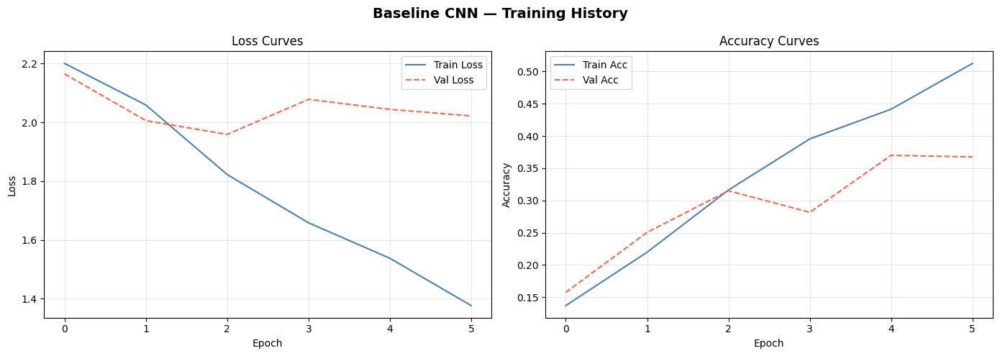

In [14]:
plot_history(history_baseline, title='Baseline CNN — Training History', save_name='history_baseline.png')


 Baseline CNN
 Accuracy  : 0.3333
 Precision : 0.3174
 Recall    : 0.3333
 F1-Score  : 0.3041
              precision    recall  f1-score   support

      aphids       0.57      0.30      0.39        44
    armyworm       0.12      0.02      0.04        43
      beetle       0.30      0.66      0.41        50
    bollworm       0.23      0.22      0.23        36
 grasshopper       0.19      0.17      0.18        46
       mites       0.23      0.43      0.30        42
    mosquito       0.84      0.76      0.80        50
      sawfly       0.21      0.24      0.23        37
  stem_borer       0.00      0.00      0.00        36

    accuracy                           0.33       384
   macro avg       0.30      0.31      0.29       384
weighted avg       0.32      0.33      0.30       384



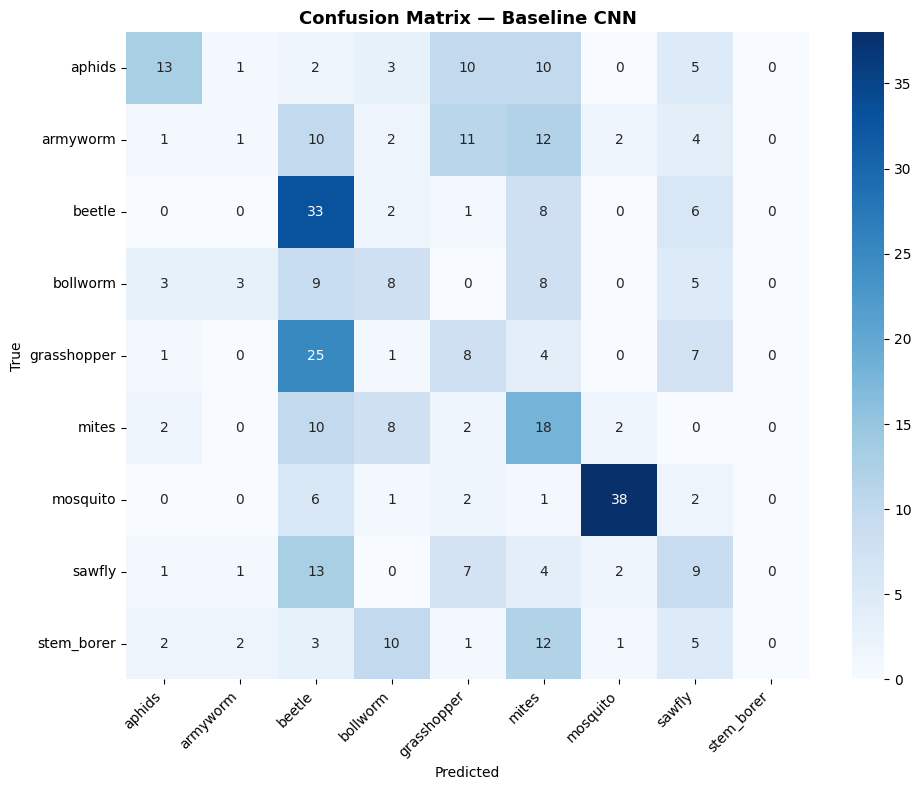

In [15]:
metrics_baseline = evaluate_model(baseline_model, test_gen, CLASS_NAMES, title='Baseline CNN')

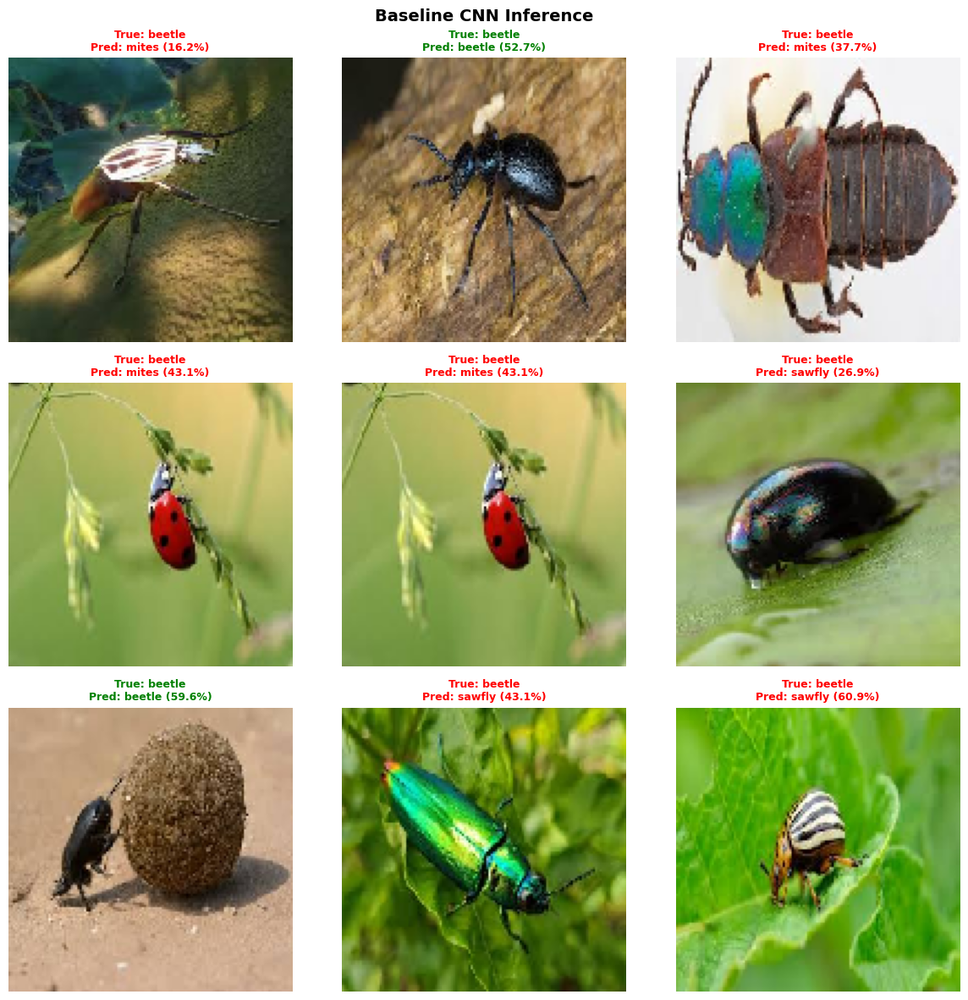

In [16]:
show_predictions(baseline_model, test_gen, CLASS_NAMES, title='Baseline CNN Inference')

---
## 4. Part A — Deeper CNN with Regularization

In [40]:
# ── Deeper CNN Architecture (≥2x layers + BatchNorm + Dropout) ────────────

def build_deeper_model(input_shape=(128, 128, 3), num_classes=9, optimizer='adam'):
    model = models.Sequential([
        layers.Conv2D(32, (3,3), padding='same', activation='relu', input_shape=input_shape),
        layers.BatchNormalization(),
        layers.Conv2D(32, (3,3), padding='same', activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2,2)),
        layers.Dropout(0.25),

        layers.Conv2D(64, (3,3), padding='same', activation='relu'),
        layers.BatchNormalization(),
        layers.Conv2D(64, (3,3), padding='same', activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2,2)),
        layers.Dropout(0.25),

        layers.Conv2D(128, (3,3), padding='same', activation='relu'),
        layers.BatchNormalization(),
        layers.Conv2D(128, (3,3), padding='same', activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2,2)),
        layers.Dropout(0.25),

        layers.Conv2D(256, (3,3), padding='same', activation='relu'),
        layers.BatchNormalization(),
        layers.Conv2D(256, (3,3), padding='same', activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2,2)),
        layers.Dropout(0.30),

        layers.Flatten(),
        layers.Dense(514, activation='relu', kernel_regularizer=regularizers.l2(1e-4)),
        layers.BatchNormalization(),
        layers.Dropout(0.5),
        layers.Dense(256, activation='relu',  kernel_regularizer=regularizers.l2(1e-4)),
        layers.Dropout(0.4),
        layers.Dense(128, activation='relu'),

        layers.Dense(num_classes, activation='softmax')
    ], name='Deeper_CNN')

    opt = Adam(learning_rate=1e-3) if optimizer == 'adam' else SGD(learning_rate=1e-2, momentum=0.9)
    model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])
    return model

deeper_model_adam = build_deeper_model(num_classes=NUM_CLASSES, optimizer='adam')
deeper_model_adam.summary()

Model: "Deeper_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_40 (Conv2D)              │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_46          │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_41 (Conv2D)              │ (None, 128, 128, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_47          │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_20 (MaxPooling2D) │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_24 (Dropout)            │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_42 (Conv2D)              │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_48          │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_43 (Conv2D)              │ (None, 64, 64, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_49          │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_21 (MaxPooling2D) │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_25 (Dropout)            │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_44 (Conv2D)              │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_50          │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_45 (Conv2D)              │ (None, 32, 32, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_51          │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_22 (MaxPooling2D) │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_26 (Dropout)            │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_46 (Conv2D)              │ (None, 16, 16, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_52          │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_47 (Conv2D)              │ (None, 16, 16, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 9,765,939 (37.25 MB)

 Trainable params: 9,762,991 (37.24 MB)

 Non-trainable params: 2,948 (11.52 KB)

In [41]:
# ── Train Deeper Model (Adam) ──────────────────────────────────────────────
callbacks_deep = [
    EarlyStopping(monitor='val_loss', patience=8, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, verbose=1, min_lr=1e-7),
    ModelCheckpoint('best_deeper_adam.keras', monitor='val_accuracy', save_best_only=True, verbose=0)
]

print("Training Deeper CNN (Adam)...")
t0_deep_adam = time.time()

history_deeper_adam = deeper_model_adam.fit(
    train_gen,
    validation_data=val_gen,
    epochs=EPOCHS_A,
    callbacks=callbacks_deep,
    verbose=1
)

time_deeper_adam = time.time() - t0_deep_adam
print(f"\nDeeper CNN (Adam) training time: {time_deeper_adam/60:.2f} minutes")

Training Deeper CNN (Adam)...
Epoch 1/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 36s 400ms/step - accuracy: 0.1474 - loss: 2.7548 - val_accuracy: 0.1002 - val_loss: 3.9471 - learning_rate: 0.0010
Epoch 2/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 11s 199ms/step - accuracy: 0.2097 - loss: 2.5187 - val_accuracy: 0.1146 - val_loss: 4.4441 - learning_rate: 0.0010
Epoch 3/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 10s 193ms/step - accuracy: 0.2523 - loss: 2.2336 - val_accuracy: 0.1146 - val_loss: 3.7663 - learning_rate: 0.0010
Epoch 4/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 11s 204ms/step - accuracy: 0.3155 - loss: 2.1211 - val_accuracy: 0.1313 - val_loss: 3.2142 - learning_rate: 0.0010
Epoch 5/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 10s 190ms/step - accuracy: 0.3748 - loss: 1.9728 - val_accuracy: 0.1050 - val_loss: 2.7522 - learning_rate: 0.0010
Epoch 6/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 10s 188ms/step - accuracy: 0.3648 - loss: 1.9991 - val_accuracy: 0.1146 - val_loss: 3.6519 - learning_rate: 0.0010
Epoch 7/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 11s 201ms/step

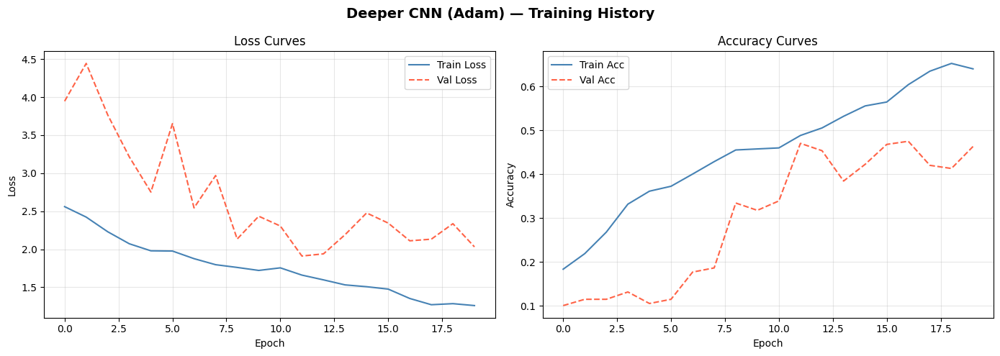

In [42]:
plot_history(history_deeper_adam, title='Deeper CNN (Adam) — Training History', save_name='history_deeper_adam.png')


 Deeper CNN Adam
 Accuracy  : 0.5599
 Precision : 0.5686
 Recall    : 0.5599
 F1-Score  : 0.5491
              precision    recall  f1-score   support

      aphids       0.68      0.61      0.64        44
    armyworm       0.64      0.42      0.51        43
      beetle       0.68      0.84      0.75        50
    bollworm       0.50      0.39      0.44        36
 grasshopper       0.48      0.46      0.47        46
       mites       0.47      0.45      0.46        42
    mosquito       0.59      0.88      0.70        50
      sawfly       0.67      0.32      0.44        37
  stem_borer       0.37      0.50      0.42        36

    accuracy                           0.56       384
   macro avg       0.56      0.54      0.54       384
weighted avg       0.57      0.56      0.55       384



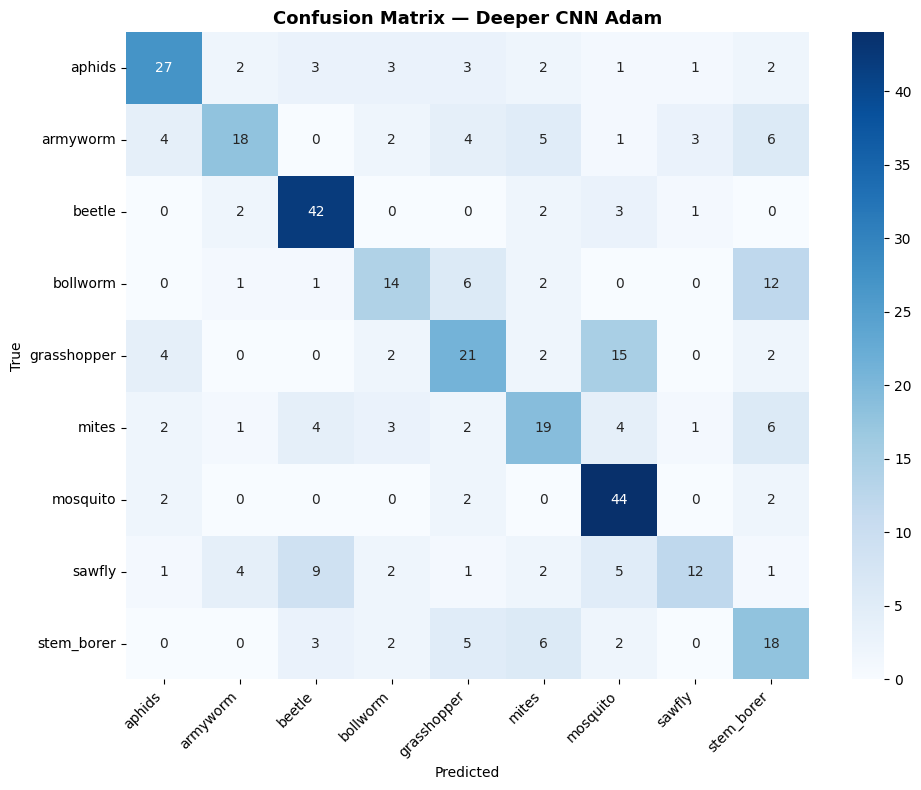

In [43]:
metrics_deeper_adam = evaluate_model(deeper_model_adam, test_gen, CLASS_NAMES, title='Deeper CNN Adam')

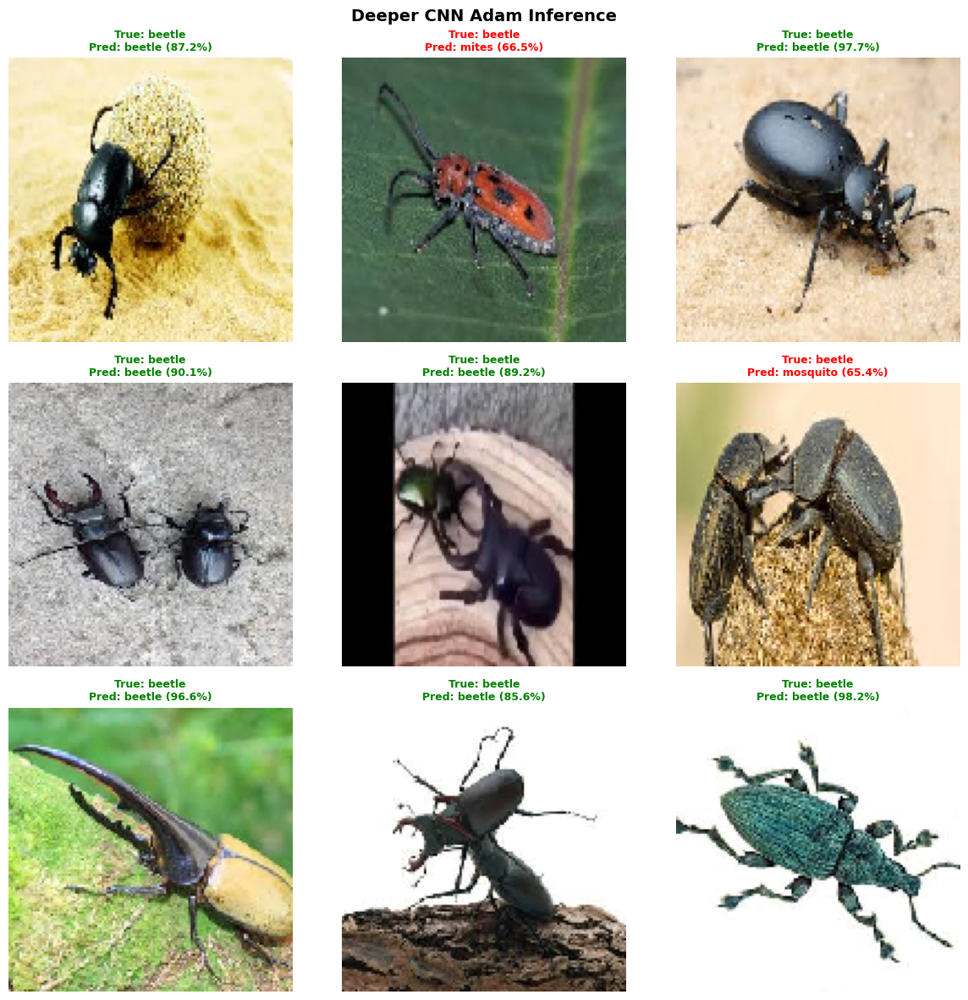

In [44]:
show_predictions(deeper_model_adam, test_gen, CLASS_NAMES, title='Deeper CNN Adam Inference')

---
## 5. Part A — Optimizer Analysis: SGD vs Adam

In [45]:
# ── Train Deeper Model (SGD) ───────────────────────────────────────────────
deeper_model_sgd = build_deeper_model(num_classes=NUM_CLASSES, optimizer='sgd')

callbacks_sgd = [
    EarlyStopping(monitor='val_loss', patience=8, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, verbose=1, min_lr=1e-7),
    ModelCheckpoint('best_deeper_sgd.keras', monitor='val_accuracy', save_best_only=True, verbose=0)
]

print("Training Deeper CNN (SGD)...")
t0_deep_sgd = time.time()

history_deeper_sgd = deeper_model_sgd.fit(
    train_gen,
    validation_data=val_gen,
    epochs=EPOCHS_A,
    callbacks=callbacks_sgd,
    verbose=1
)

time_deeper_sgd = time.time() - t0_deep_sgd
print(f"\nDeeper CNN (SGD) training time: {time_deeper_sgd/60:.2f} minutes")

Training Deeper CNN (SGD)...
Epoch 1/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 31s 381ms/step - accuracy: 0.1370 - loss: 2.8230 - val_accuracy: 0.1289 - val_loss: 13.1119 - learning_rate: 0.0100
Epoch 2/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 11s 199ms/step - accuracy: 0.2263 - loss: 2.2470 - val_accuracy: 0.2124 - val_loss: 2.6379 - learning_rate: 0.0100
Epoch 3/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 11s 206ms/step - accuracy: 0.2885 - loss: 2.1377 - val_accuracy: 0.2220 - val_loss: 2.8866 - learning_rate: 0.0100
Epoch 4/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 11s 202ms/step - accuracy: 0.3070 - loss: 2.1100 - val_accuracy: 0.3628 - val_loss: 2.0434 - learning_rate: 0.0100
Epoch 5/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 10s 191ms/step - accuracy: 0.3576 - loss: 1.9905 - val_accuracy: 0.3150 - val_loss: 2.0498 - learning_rate: 0.0100
Epoch 6/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 10s 194ms/step - accuracy: 0.3632 - loss: 1.9247 - val_accuracy: 0.3413 - val_loss: 1.9761 - learning_rate: 0.0100
Epoch 7/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 10s 195ms/step

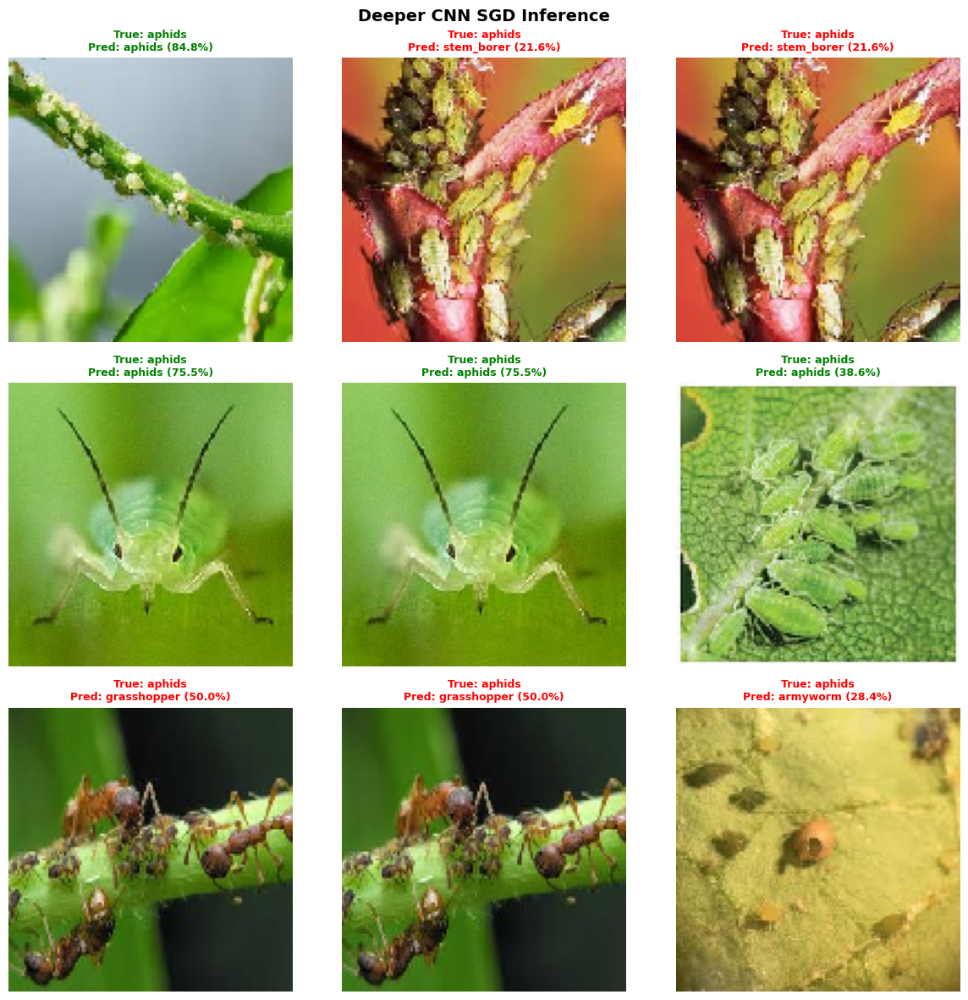

In [46]:
show_predictions(deeper_model_sgd, test_gen, CLASS_NAMES, title='Deeper CNN SGD Inference')


 Deeper CNN SGD
 Accuracy  : 0.6745
 Precision : 0.6861
 Recall    : 0.6745
 F1-Score  : 0.6716
              precision    recall  f1-score   support

      aphids       0.72      0.77      0.75        44
    armyworm       0.57      0.60      0.58        43
      beetle       0.74      0.78      0.76        50
    bollworm       0.62      0.78      0.69        36
 grasshopper       0.60      0.70      0.65        46
       mites       0.55      0.62      0.58        42
    mosquito       0.89      0.80      0.84        50
      sawfly       0.67      0.54      0.60        37
  stem_borer       0.78      0.39      0.52        36

    accuracy                           0.67       384
   macro avg       0.68      0.66      0.66       384
weighted avg       0.69      0.67      0.67       384



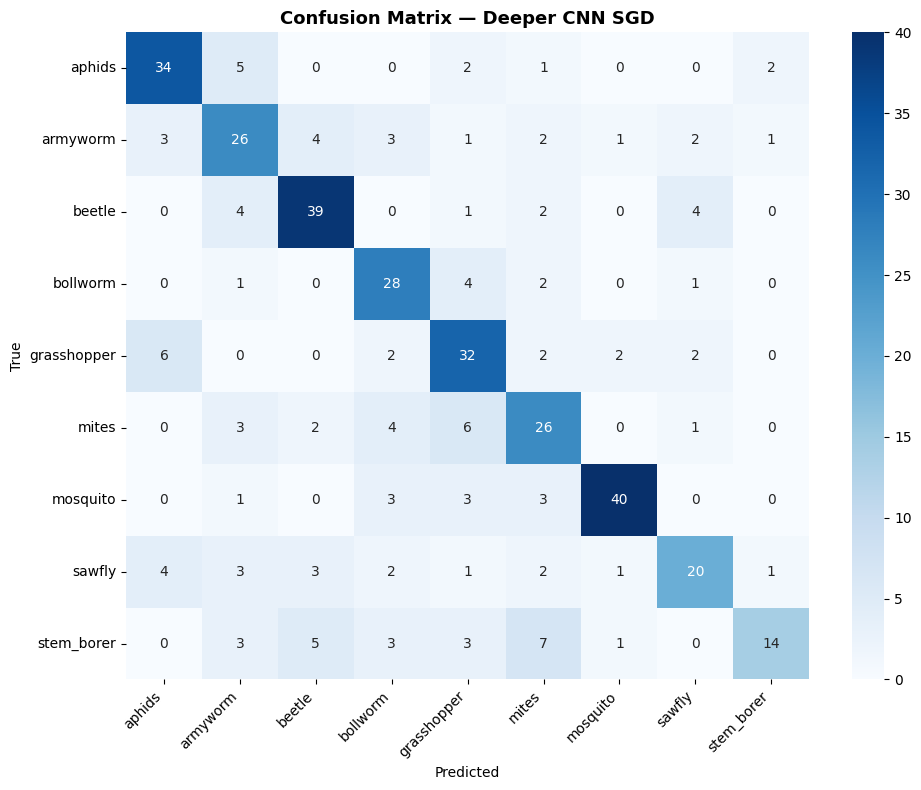

In [47]:
metrics_deeper_sgd = evaluate_model(deeper_model_sgd, test_gen, CLASS_NAMES, title='Deeper CNN SGD')

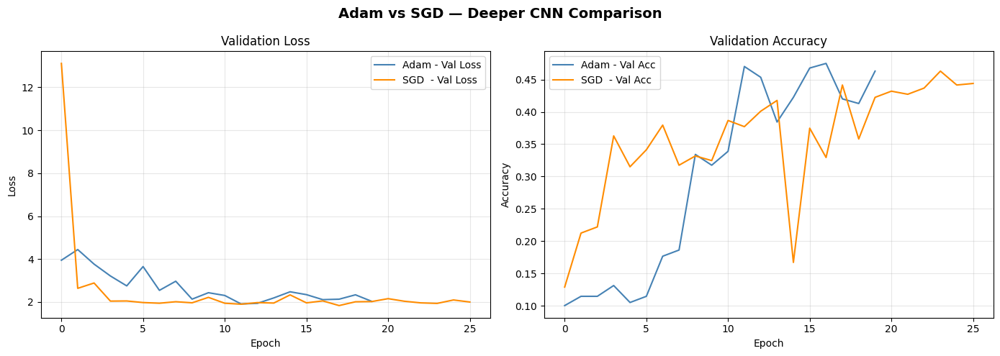

In [48]:
# ── Overlay SGD vs Adam loss curves ───────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Adam vs SGD — Deeper CNN Comparison', fontsize=14, fontweight='bold')

axes[0].plot(history_deeper_adam.history['val_loss'], label='Adam - Val Loss', color='steelblue')
axes[0].plot(history_deeper_sgd.history['val_loss'],  label='SGD  - Val Loss', color='darkorange')
axes[0].set_title('Validation Loss'); axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Loss')
axes[0].legend(); axes[0].grid(alpha=0.3)

axes[1].plot(history_deeper_adam.history['val_accuracy'], label='Adam - Val Acc', color='steelblue')
axes[1].plot(history_deeper_sgd.history['val_accuracy'],  label='SGD  - Val Acc', color='darkorange')
axes[1].set_title('Validation Accuracy'); axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Accuracy')
axes[1].legend(); axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.savefig('optimizer_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

---
## 6. Part A — Ablation Study (Dropout Removed)

In [49]:
from tensorflow.keras import models, layers, regularizers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import time


def build_deeper_with_batchnorm(input_shape=(128, 128, 3), num_classes=9):
    model = models.Sequential([
        layers.Conv2D(32, (3,3), padding='same', input_shape=input_shape),
        layers.BatchNormalization(),
        layers.Activation('relu'),

        layers.Conv2D(32, (3,3), padding='same'),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D((2,2)),

        layers.Conv2D(64, (3,3), padding='same'),
        layers.BatchNormalization(),
        layers.Activation('relu'),

        layers.Conv2D(64, (3,3), padding='same'),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D((2,2)),

        layers.Conv2D(128, (3,3), padding='same'),
        layers.BatchNormalization(),
        layers.Activation('relu'),

        layers.Conv2D(128, (3,3), padding='same'),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D((2,2)),

        layers.Conv2D(256, (3,3), padding='same'),
        layers.BatchNormalization(),
        layers.Activation('relu'),

        layers.Conv2D(256, (3,3), padding='same'),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D((2,2)),

        layers.Flatten(),

        layers.Dense(1024, activation='relu',
                     kernel_regularizer=regularizers.l2(1e-4)),
        layers.BatchNormalization(),

        layers.Dense(512, activation='relu',
                     kernel_regularizer=regularizers.l2(1e-4)),
        layers.BatchNormalization(),

        layers.Dense(256, activation='relu'),
        layers.Dense(num_classes, activation='softmax')
    ], name='Deeper_With_BatchNorm')

    model.compile(
        optimizer=Adam(1e-3),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model


ablation_model = build_deeper_with_batchnorm(num_classes=NUM_CLASSES)

print("Training Ablation Model (BatchNorm instead of Dropout)...")

t0_abl = time.time()

history_ablation = ablation_model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=EPOCHS_A,
    callbacks=[
        EarlyStopping(
            monitor='val_loss',
            patience=7,
            restore_best_weights=True,
            verbose=1
        )
    ],
    verbose=1
)

time_ablation = time.time() - t0_abl
print(f"\nAblation model training time: {time_ablation/60:.2f} minutes")

Training Ablation Model (BatchNorm instead of Dropout)...
Epoch 1/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 29s 331ms/step - accuracy: 0.2480 - loss: 2.6634 - val_accuracy: 0.1337 - val_loss: 3.7579
Epoch 2/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 10s 193ms/step - accuracy: 0.4190 - loss: 2.0342 - val_accuracy: 0.1862 - val_loss: 4.4108
Epoch 3/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 10s 191ms/step - accuracy: 0.4957 - loss: 1.8591 - val_accuracy: 0.1814 - val_loss: 4.8147
Epoch 4/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 10s 188ms/step - accuracy: 0.5167 - loss: 1.7121 - val_accuracy: 0.1695 - val_loss: 5.9194
Epoch 5/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 10s 195ms/step - accuracy: 0.5992 - loss: 1.4788 - val_accuracy: 0.1862 - val_loss: 5.4306
Epoch 6/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 10s 190ms/step - accuracy: 0.6415 - loss: 1.3335 - val_accuracy: 0.1241 - val_loss: 6.9341
Epoch 7/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 11s 199ms/step - accuracy: 0.6783 - loss: 1.2123 - val_accuracy: 0.3174 - val_loss: 3.0729
Epoch 8/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 1


 Ablation No Dropout
 Accuracy  : 0.7214
 Precision : 0.7449
 Recall    : 0.7214
 F1-Score  : 0.7230
              precision    recall  f1-score   support

      aphids       0.76      0.66      0.71        44
    armyworm       0.89      0.58      0.70        43
      beetle       0.88      0.76      0.82        50
    bollworm       0.63      0.72      0.68        36
 grasshopper       0.71      0.87      0.78        46
       mites       0.51      0.76      0.61        42
    mosquito       0.76      0.84      0.80        50
      sawfly       0.81      0.68      0.74        37
  stem_borer       0.69      0.56      0.62        36

    accuracy                           0.72       384
   macro avg       0.74      0.71      0.72       384
weighted avg       0.74      0.72      0.72       384



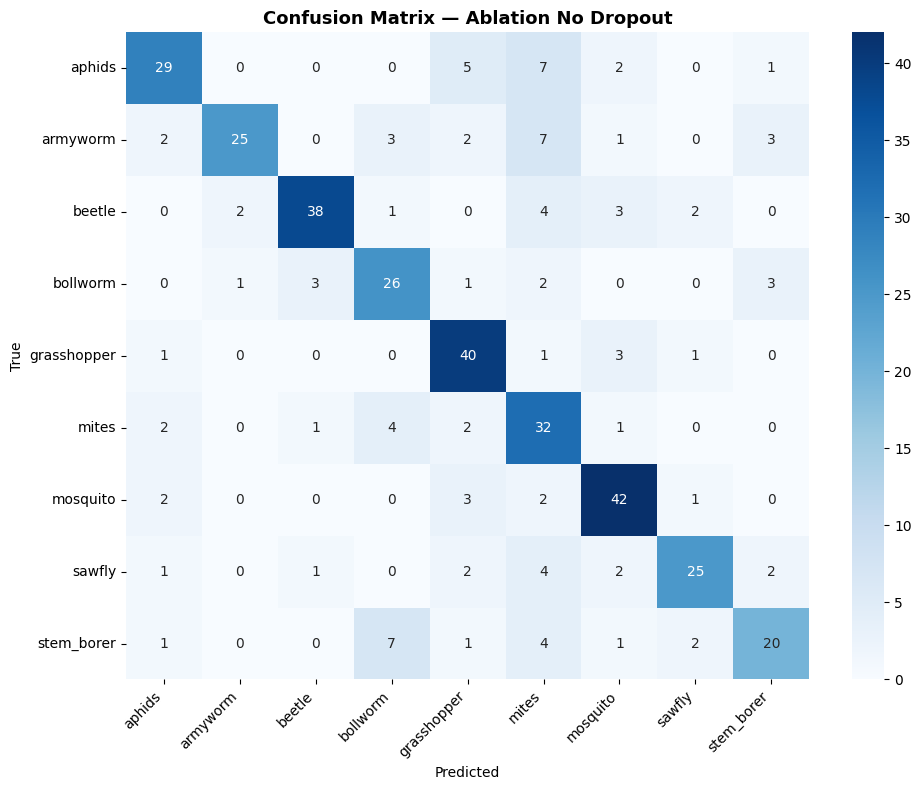

In [50]:
metrics_ablation = evaluate_model(ablation_model, test_gen, CLASS_NAMES, title='Ablation No Dropout')

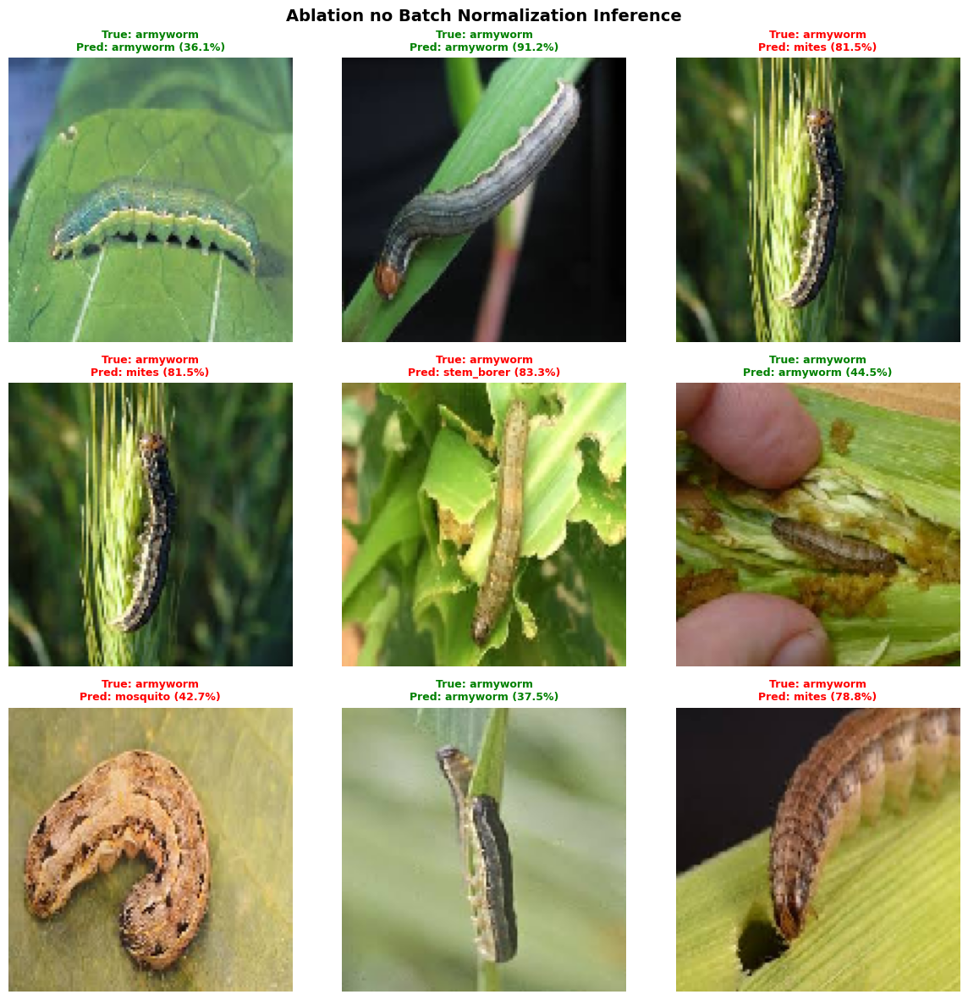

In [51]:
show_predictions(ablation_model, test_gen, CLASS_NAMES, title='Ablation no Batch Normalization Inference')

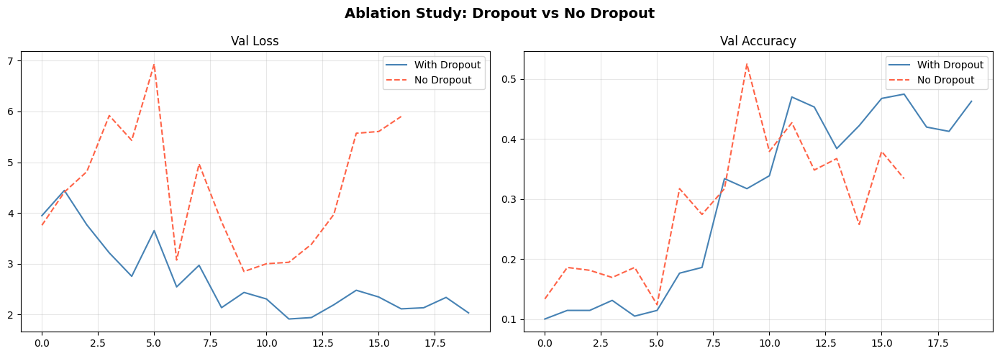

In [52]:
# ── Ablation: with vs without dropout ─────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Ablation Study: Dropout vs No Dropout', fontsize=14, fontweight='bold')

axes[0].plot(history_deeper_adam.history['val_loss'], label='With Dropout', color='steelblue')
axes[0].plot(history_ablation.history['val_loss'],    label='No Dropout',   color='tomato', linestyle='--')
axes[0].set_title('Val Loss'); axes[0].legend(); axes[0].grid(alpha=0.3)

axes[1].plot(history_deeper_adam.history['val_accuracy'], label='With Dropout', color='steelblue')
axes[1].plot(history_ablation.history['val_accuracy'],    label='No Dropout',   color='tomato', linestyle='--')
axes[1].set_title('Val Accuracy'); axes[1].legend(); axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.savefig('ablation_study.png', dpi=150, bbox_inches='tight')
plt.show()

---
## 7. Part A — Comprehensive Comparative Summary

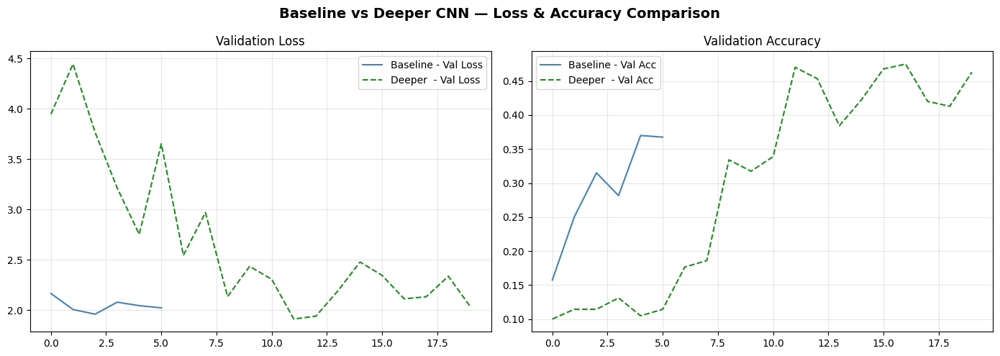

In [53]:
# ── Side-by-side loss curves: Baseline vs Deeper ──────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Baseline vs Deeper CNN — Loss & Accuracy Comparison', fontsize=14, fontweight='bold')

axes[0].plot(history_baseline.history['val_loss'],     label='Baseline - Val Loss',   color='steelblue')
axes[0].plot(history_deeper_adam.history['val_loss'],  label='Deeper  - Val Loss',   color='forestgreen', linestyle='--')
axes[0].set_title('Validation Loss'); axes[0].legend(); axes[0].grid(alpha=0.3)

axes[1].plot(history_baseline.history['val_accuracy'],     label='Baseline - Val Acc', color='steelblue')
axes[1].plot(history_deeper_adam.history['val_accuracy'],  label='Deeper  - Val Acc', color='forestgreen', linestyle='--')
axes[1].set_title('Validation Accuracy'); axes[1].legend(); axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.savefig('baseline_vs_deeper.png', dpi=150, bbox_inches='tight')
plt.show()

In [54]:
# ── Summary table ──────────────────────────────────────────────────────────
all_metrics = {
    'Baseline CNN (Adam)':    {**metrics_baseline,  'time_min': time_baseline/60},
    'Deeper CNN (Adam)':      {**metrics_deeper_adam, 'time_min': time_deeper_adam/60},
    'Deeper CNN (SGD)':       {**metrics_deeper_sgd,  'time_min': time_deeper_sgd/60},
    'Ablation (No Dropout)':  {**metrics_ablation,    'time_min': time_ablation/60},
}

print(f"\n{'Model':<30} {'Accuracy':>10} {'Precision':>10} {'Recall':>10} {'F1':>10} {'Time(min)':>12}")
print('-' * 85)
for name, m in all_metrics.items():
    print(f"{name:<30} {m['accuracy']:>10.4f} {m['precision']:>10.4f} {m['recall']:>10.4f} {m['f1']:>10.4f} {m['time_min']:>12.2f}")


Model                            Accuracy  Precision     Recall         F1    Time(min)
-------------------------------------------------------------------------------------
Baseline CNN (Adam)                0.3333     0.3174     0.3333     0.3041         1.24
Deeper CNN (Adam)                  0.5599     0.5686     0.5599     0.5491         3.93
Deeper CNN (SGD)                   0.6745     0.6861     0.6745     0.6716         4.85
Ablation (No Dropout)              0.7214     0.7449     0.7214     0.7230         3.21


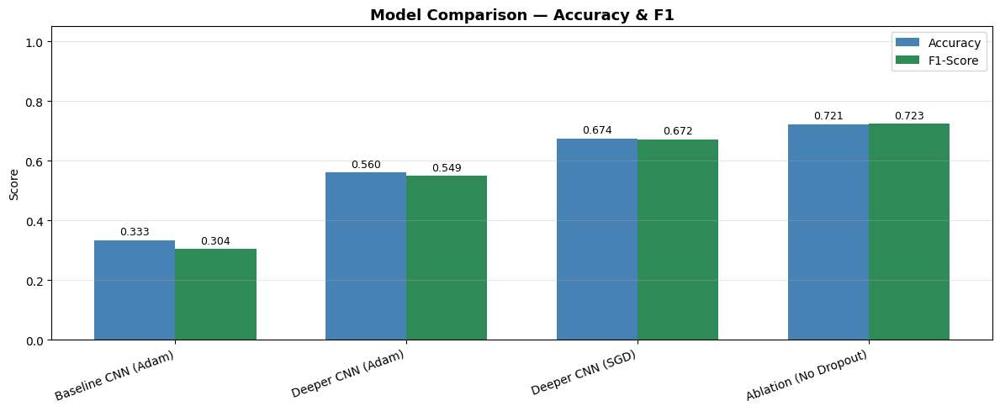

In [55]:
# ── Bar chart of F1 scores ─────────────────────────────────────────────────
names  = list(all_metrics.keys())
f1s    = [all_metrics[n]['f1'] for n in names]
accs   = [all_metrics[n]['accuracy'] for n in names]

x = np.arange(len(names))
width = 0.35

fig, ax = plt.subplots(figsize=(12, 5))
bars1 = ax.bar(x - width/2, accs, width, label='Accuracy', color='steelblue')
bars2 = ax.bar(x + width/2, f1s,  width, label='F1-Score',  color='seagreen')
ax.set_xticks(x); ax.set_xticklabels(names, rotation=20, ha='right')
ax.set_ylim(0, 1.05)
ax.set_ylabel('Score'); ax.set_title('Model Comparison — Accuracy & F1', fontsize=13, fontweight='bold')
ax.legend(); ax.grid(axis='y', alpha=0.3)
for bar in list(bars1) + list(bars2):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
            f'{bar.get_height():.3f}', ha='center', va='bottom', fontsize=9)
plt.tight_layout()
plt.savefig('model_comparison_bar.png', dpi=150, bbox_inches='tight')
plt.show()

---
# PART B — Transfer Learning with VGG16
---
## 8. Loading & Adapting Pre-Trained VGG16

In [56]:
IMG_SIZE_VGG = (224, 224)
EPOCHS_B     = 35

train_gen_vgg = ImageDataGenerator(
    rotation_range     = 20,
    width_shift_range  = 0.15,
    height_shift_range = 0.15,
    shear_range        = 0.1,
    zoom_range         = 0.15,
    horizontal_flip    = False,
    vertical_flip      = False,   
    brightness_range   = [0.9, 1.1],
    fill_mode          = 'nearest',
    validation_split   = 0.2
).flow_from_directory(
    TRAIN_DIR, target_size=IMG_SIZE_VGG, batch_size=BATCH_SIZE,
    class_mode='categorical', subset='training', seed=SEED
)

val_gen_vgg = ImageDataGenerator(
    validation_split = 0.2             # NO rescale
).flow_from_directory(
    TRAIN_DIR, target_size=IMG_SIZE_VGG, batch_size=BATCH_SIZE,
    class_mode='categorical', subset='validation', seed=SEED, shuffle=False
)

test_gen_vgg = ImageDataGenerator().flow_from_directory(    # NO rescale
    TEST_DIR, target_size=IMG_SIZE_VGG, batch_size=BATCH_SIZE,
    class_mode='categorical', shuffle=False
)

print(f"VGG train samples : {train_gen_vgg.samples}")
print(f"VGG val samples   : {val_gen_vgg.samples}")
print(f"VGG test samples  : {test_gen_vgg.samples}")

Found 1692 images belonging to 9 classes.
Found 419 images belonging to 9 classes.
Found 384 images belonging to 9 classes.
VGG train samples : 1692
VGG val samples   : 419
VGG test samples  : 384


In [90]:
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras import regularizers

base_vgg = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_vgg.trainable = False

vgg_model = models.Sequential([
    layers.Input(shape=(224, 224, 3)),
    layers.Lambda(preprocess_input),              
    base_vgg,
    layers.GlobalAveragePooling2D(),

    layers.Dense(514,kernel_initializer='he_normal', kernel_regularizer=regularizers.l2(1e-4)),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.Dropout(0.45),

    layers.Dense(256, kernel_initializer='he_normal',kernel_regularizer=regularizers.l2(1e-4)),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.Dropout(0.35),

    layers.Dense(128),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.Dropout(0.25),

    layers.Dense(NUM_CLASSES, activation='softmax')
], name='VGG16_Feature_Extraction')

vgg_model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print(f"Trainable layers (frozen base): {len(vgg_model.trainable_variables)}")
vgg_model.summary()

Trainable layers (frozen base): 14


Model: "VGG16_Feature_Extraction"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lambda_4 (Lambda)               │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_48 (Dense)                │ (None, 514)            │       263,682 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_86          │ (None, 514)            │         2,056 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_28 (Activation)      │ (None, 514)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_48 (Dropout)            │ (None, 514)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_49 (Dense)                │ (None, 256)            │       131,840 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_87          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_29 (Activation)      │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_49 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_88          │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_30 (Activation)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_50 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 9)              │         1,161 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,147,859 (57.78 MB)

 Trainable params: 431,375 (1.65 MB)

 Non-trainable params: 14,716,484 (56.14 MB)

In [91]:
# ── Train Phase 1 (feature extraction) ────────────────────────────────────
callbacks_vgg1 = [
    EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1),
    ModelCheckpoint('best_vgg_phase1.keras', monitor='val_accuracy', save_best_only=True, verbose=0)
]

print("Phase 1 — Feature Extraction (frozen VGG16 base)...")
t0_vgg1 = time.time()

history_vgg1 = vgg_model.fit(
    train_gen_vgg,
    validation_data=val_gen_vgg,
    epochs=EPOCHS_B,
    callbacks=callbacks_vgg1,
    verbose=1,
    class_weight = class_weight_dict
)

time_vgg1 = time.time() - t0_vgg1
print(f"\nPhase 1 training time: {time_vgg1/60:.2f} minutes")

Phase 1 — Feature Extraction (frozen VGG16 base)...
Epoch 1/35
53/53 ━━━━━━━━━━━━━━━━━━━━ 36s 563ms/step - accuracy: 0.1205 - loss: 2.7335 - val_accuracy: 0.2243 - val_loss: 2.3555
Epoch 2/35
53/53 ━━━━━━━━━━━━━━━━━━━━ 25s 479ms/step - accuracy: 0.1995 - loss: 2.4301 - val_accuracy: 0.3914 - val_loss: 1.9725
Epoch 3/35
53/53 ━━━━━━━━━━━━━━━━━━━━ 26s 482ms/step - accuracy: 0.2946 - loss: 2.1385 - val_accuracy: 0.5179 - val_loss: 1.7599
Epoch 4/35
53/53 ━━━━━━━━━━━━━━━━━━━━ 25s 478ms/step - accuracy: 0.3364 - loss: 2.0140 - val_accuracy: 0.5442 - val_loss: 1.6208
Epoch 5/35
53/53 ━━━━━━━━━━━━━━━━━━━━ 26s 482ms/step - accuracy: 0.4068 - loss: 1.8444 - val_accuracy: 0.5776 - val_loss: 1.5210
Epoch 6/35
53/53 ━━━━━━━━━━━━━━━━━━━━ 25s 466ms/step - accuracy: 0.4728 - loss: 1.7290 - val_accuracy: 0.5680 - val_loss: 1.4387
Epoch 7/35
53/53 ━━━━━━━━━━━━━━━━━━━━ 25s 466ms/step - accuracy: 0.5256 - loss: 1.6029 - val_accuracy: 0.6110 - val_loss: 1.3757
Epoch 8/35
53/53 ━━━━━━━━━━━━━━━━━━━━ 25s 477

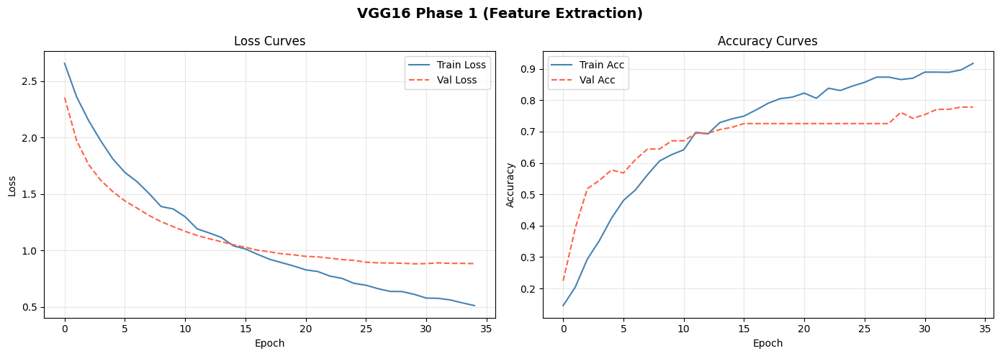

In [92]:
plot_history(history_vgg1, title='VGG16 Phase 1 (Feature Extraction)', save_name='history_vgg1.png')


 VGG16 Fine-Tuned
 Accuracy  : 0.9167
 Precision : 0.9168
 Recall    : 0.9167
 F1-Score  : 0.9155
              precision    recall  f1-score   support

      aphids       0.83      0.89      0.86        44
    armyworm       0.95      0.86      0.90        43
      beetle       0.94      0.98      0.96        50
    bollworm       0.90      0.97      0.93        36
 grasshopper       0.96      1.00      0.98        46
       mites       0.90      0.88      0.89        42
    mosquito       0.98      0.98      0.98        50
      sawfly       0.87      0.73      0.79        37
  stem_borer       0.89      0.92      0.90        36

    accuracy                           0.92       384
   macro avg       0.91      0.91      0.91       384
weighted avg       0.92      0.92      0.92       384



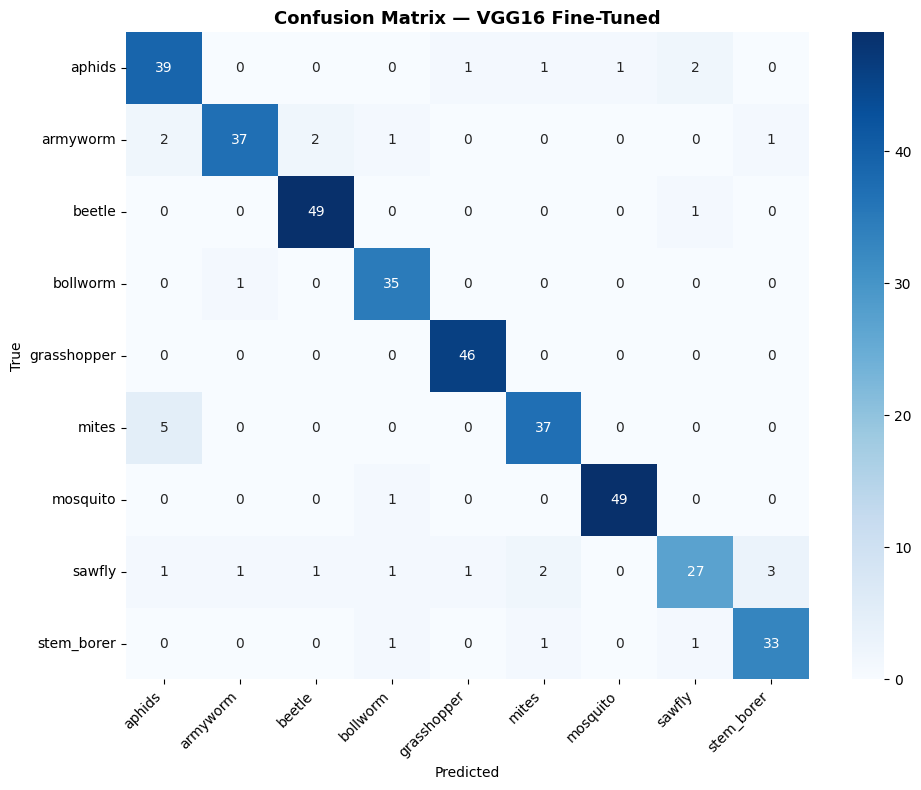

In [93]:
metrics_vgg = evaluate_model(vgg_model, test_gen_vgg, CLASS_NAMES, title='VGG16 Fine-Tuned')

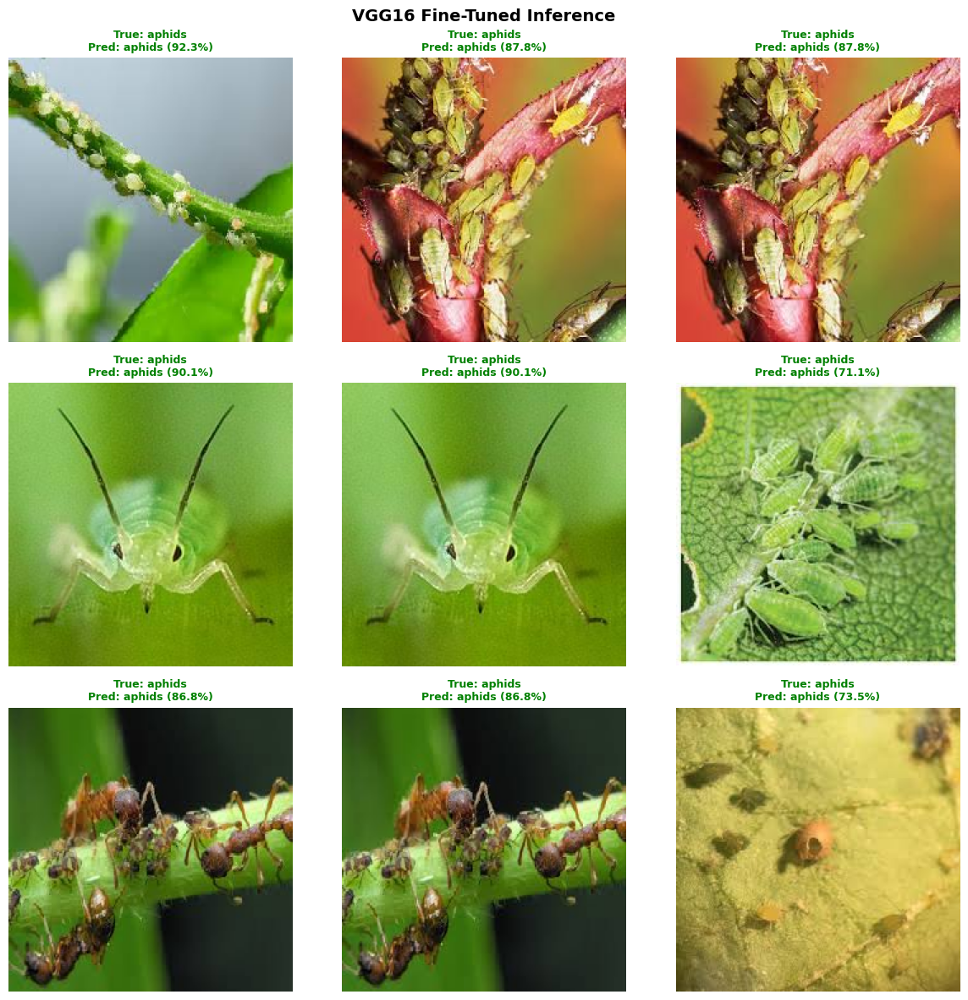

In [94]:
show_predictions(vgg_model, test_gen_vgg, CLASS_NAMES, title='VGG16 Fine-Tuned Inference')

In [95]:
MODEL_DIR = "/kaggle/working/saved_models"
os.makedirs(MODEL_DIR, exist_ok=True)
vgg_model.save(os.path.join(MODEL_DIR, "vgg16_feature_extraction.keras"))
print("Phase 1 model saved ✔")

Phase 1 model saved ✔


In [96]:
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras import regularizers

# ── Step 1: Save Phase 1 weights only ─────────────────────────────
vgg_model.save_weights(
    os.path.join(MODEL_DIR, "vgg16_phase1_weights.weights.h5")
)
print("Phase 1 weights saved ✔")

# ── Step 2: Rebuild identical architecture as Phase 2 ──────────────
base_vgg2 = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_vgg2.trainable = False

vgg_finetuned = models.Sequential([
    layers.Input(shape=(224, 224, 3)),
    layers.Lambda(preprocess_input),
    base_vgg2,
    layers.GlobalAveragePooling2D(),

    layers.Dense(514, kernel_initializer='he_normal',
                 kernel_regularizer=regularizers.l2(1e-4)),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.Dropout(0.45),

    layers.Dense(256, kernel_initializer='he_normal',
                 kernel_regularizer=regularizers.l2(1e-4)),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.Dropout(0.35),

    layers.Dense(128),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.Dropout(0.25),

    layers.Dense(NUM_CLASSES, activation='softmax')
], name='VGG16_Fine_Tuned')

# ── Step 3: Load Phase 1 weights into new model ────────────────────
vgg_finetuned.load_weights(
    os.path.join(MODEL_DIR, "vgg16_phase1_weights.weights.h5")
)
print("Phase 1 weights loaded into Phase 2 model ✔")

# ── Step 4: Unfreeze last 4 layers of VGG16 ───────────────────────
base = vgg_finetuned.get_layer("vgg16")
for layer in base.layers:
    layer.trainable = False
for layer in base.layers[-4:]:
    layer.trainable = True

vgg_finetuned.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)
print(f"Trainable variables after unfreezing: {len(vgg_finetuned.trainable_variables)}")

# ── Step 5: Train Phase 2 ─────────────────────────────────────────
callbacks_vgg2 = [
    EarlyStopping(monitor='val_loss', patience=9,
                  restore_best_weights=True, verbose=1),
    ModelCheckpoint(
        os.path.join(MODEL_DIR, "vgg16_fine_tuned.keras"),
        monitor='val_accuracy', save_best_only=True, verbose=0
    )
]

print("\nPhase 2 — Fine-Tuning (last conv block unfrozen)...")
t0_vgg2 = time.time()
history_vgg2 = vgg_finetuned.fit(
    train_gen_vgg,
    validation_data = val_gen_vgg,
    epochs          = 20,
    callbacks       = callbacks_vgg2,
    verbose         = 1
)
time_vgg2 = time.time() - t0_vgg2
print(f"\nPhase 2 training time: {time_vgg2/60:.2f} minutes")

Phase 1 weights saved ✔
Phase 1 weights loaded into Phase 2 model ✔
Trainable variables after unfreezing: 20

Phase 2 — Fine-Tuning (last conv block unfrozen)...
Epoch 1/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 39s 596ms/step - accuracy: 0.8573 - loss: 0.6311 - val_accuracy: 0.7375 - val_loss: 0.9512
Epoch 2/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 26s 486ms/step - accuracy: 0.9604 - loss: 0.3756 - val_accuracy: 0.7136 - val_loss: 0.8977
Epoch 3/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 26s 481ms/step - accuracy: 0.9809 - loss: 0.3036 - val_accuracy: 0.7733 - val_loss: 0.7789
Epoch 4/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 26s 482ms/step - accuracy: 0.9885 - loss: 0.2514 - val_accuracy: 0.7828 - val_loss: 0.9414
Epoch 5/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 25s 472ms/step - accuracy: 0.9958 - loss: 0.2280 - val_accuracy: 0.7375 - val_loss: 0.9910
Epoch 6/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 25s 475ms/step - accuracy: 0.9978 - loss: 0.2107 - val_accuracy: 0.7589 - val_loss: 0.9190
Epoch 7/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 25s 468ms/step - accuracy:

In [97]:
vgg_model.summary(expand_nested=True)

Model: "VGG16_Feature_Extraction"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lambda_4 (Lambda)               │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ input_layer_17             │ (None, 224, 224, 3)    │             0 │
│ (InputLayer)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1_conv1 (Conv2D)      │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1_conv2 (Conv2D)      │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1_pool (MaxPooling2D) │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block2_conv1 (Conv2D)      │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block2_conv2 (Conv2D)      │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block2_pool (MaxPooling2D) │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block3_conv1 (Conv2D)      │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block3_conv2 (Conv2D)      │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block3_conv3 (Conv2D)      │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block3_pool (MaxPooling2D) │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block4_conv1 (Conv2D)      │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block4_conv2 (Conv2D)      │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block4_conv3 (Conv2D)      │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block4_pool (MaxPooling2D) │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block5_conv1 (Conv2D)      │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block5_conv2 (Conv2D)      │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block5_conv3 (Conv2D)      │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block5_pool (MaxPooling2D) │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_48 (Dense)                │ (None, 514)            │       263,682 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_86          │ (None, 514)            │         2,05

 Total params: 16,010,611 (61.08 MB)

 Trainable params: 431,375 (1.65 MB)

 Non-trainable params: 14,716,484 (56.14 MB)

 Optimizer params: 862,752 (3.29 MB)

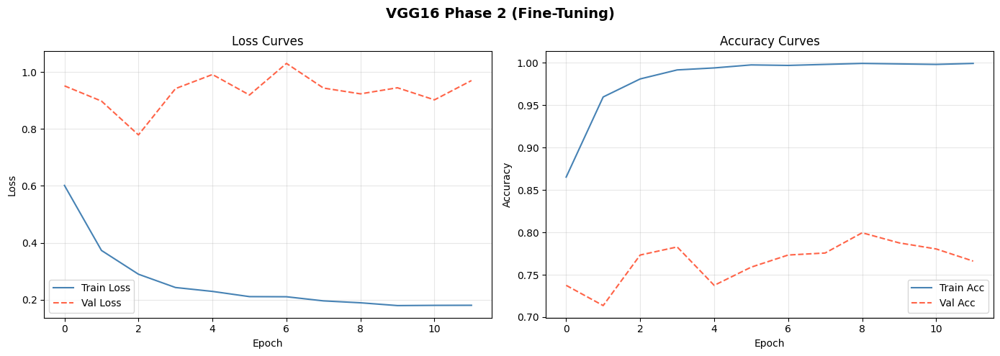

In [98]:
plot_history(history_vgg2, title='VGG16 Phase 2 (Fine-Tuning)', save_name='history_vgg2.png')


 VGG16 Fine-Tuned
 Accuracy  : 0.9167
 Precision : 0.9168
 Recall    : 0.9167
 F1-Score  : 0.9155
              precision    recall  f1-score   support

      aphids       0.83      0.89      0.86        44
    armyworm       0.95      0.86      0.90        43
      beetle       0.94      0.98      0.96        50
    bollworm       0.90      0.97      0.93        36
 grasshopper       0.96      1.00      0.98        46
       mites       0.90      0.88      0.89        42
    mosquito       0.98      0.98      0.98        50
      sawfly       0.87      0.73      0.79        37
  stem_borer       0.89      0.92      0.90        36

    accuracy                           0.92       384
   macro avg       0.91      0.91      0.91       384
weighted avg       0.92      0.92      0.92       384



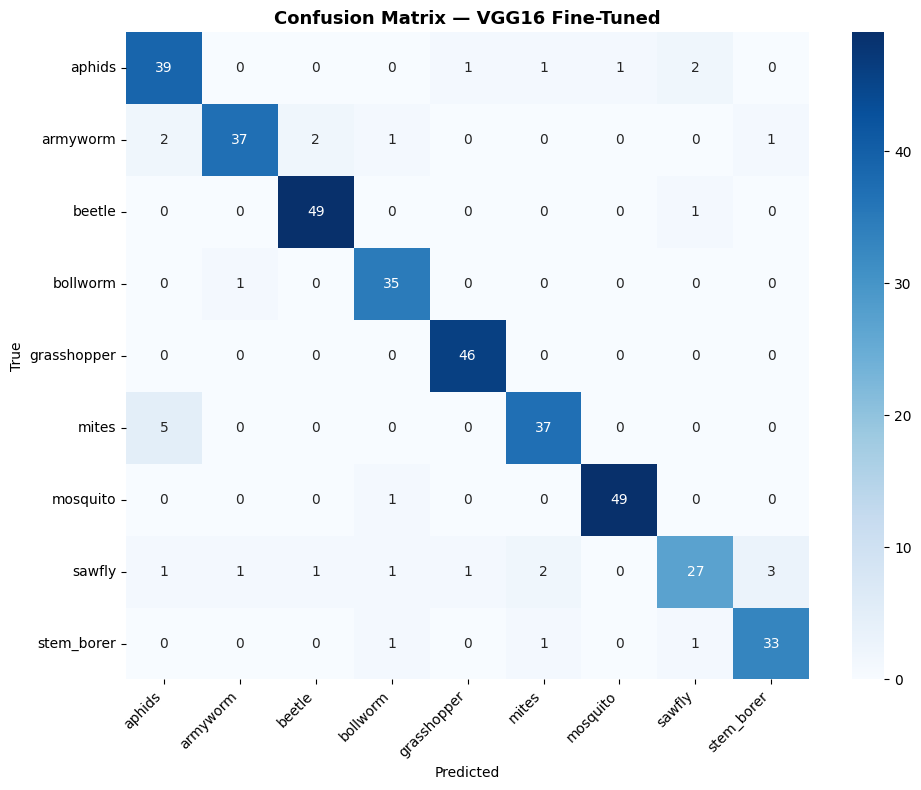

In [99]:
metrics_vgg = evaluate_model(vgg_model, test_gen_vgg, CLASS_NAMES, title='VGG16 Fine-Tuned')

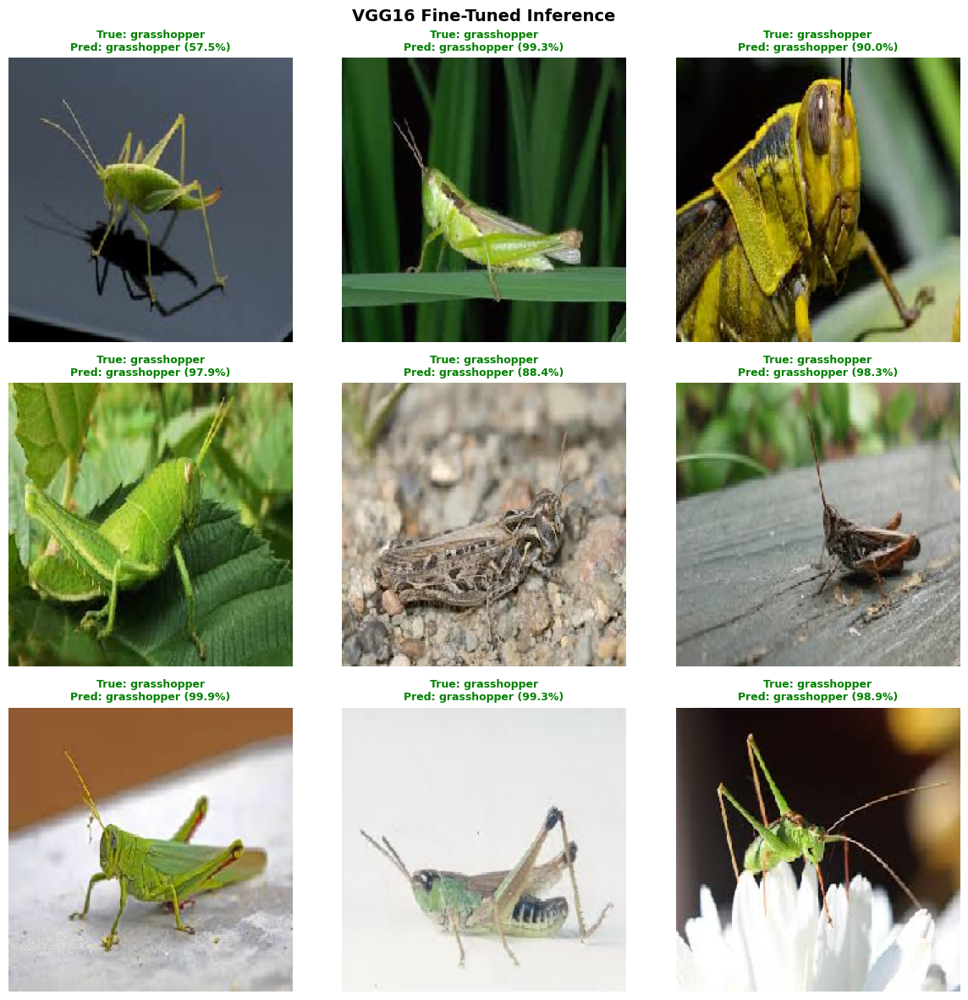

In [100]:
show_predictions(vgg_model, test_gen_vgg, CLASS_NAMES, title='VGG16 Fine-Tuned Inference')

---
## 9. Final Comparison: All Models

In [101]:
time_vgg_total = (time_vgg1 + time_vgg2) / 60

final_metrics = {
    'Baseline CNN':         {**metrics_baseline,      'time_min': time_baseline/60},
    'Deeper CNN (Adam)':    {**metrics_deeper_adam,   'time_min': time_deeper_adam/60},
    'Deeper CNN (SGD)':     {**metrics_deeper_sgd,    'time_min': time_deeper_sgd/60},
    'Ablation (No Dropout)':{**metrics_ablation,      'time_min': time_ablation/60},
    'VGG16 (Transfer)':     {**metrics_vgg,           'time_min': time_vgg_total},
}

print(f"\n{'='*90}")
print(f"{'Model':<28} {'Accuracy':>10} {'Precision':>10} {'Recall':>10} {'F1':>10} {'Time(min)':>12}")
print(f"{'='*90}")
for name, m in final_metrics.items():
    print(f"{name:<28} {m['accuracy']:>10.4f} {m['precision']:>10.4f} {m['recall']:>10.4f} "
          f"{m['f1']:>10.4f} {m['time_min']:>12.2f}")
print(f"{'='*90}")


Model                          Accuracy  Precision     Recall         F1    Time(min)
Baseline CNN                     0.3333     0.3174     0.3333     0.3041         1.24
Deeper CNN (Adam)                0.5599     0.5686     0.5599     0.5491         3.93
Deeper CNN (SGD)                 0.6745     0.6861     0.6745     0.6716         4.85
Ablation (No Dropout)            0.7214     0.7449     0.7214     0.7230         3.21
VGG16 (Transfer)                 0.9167     0.9168     0.9167     0.9155        20.04


In [102]:
import os

# ── Create model save directory ────────────────────────────────────


# ── Save Feature Extraction models ─────────────────────────────────
baseline_model.save(os.path.join(MODEL_DIR, "baseline_cnn.keras"))
deeper_model_adam.save(os.path.join(MODEL_DIR, "deeper_cnn_adam.keras"))
deeper_model_sgd.save(os.path.join(MODEL_DIR, "deeper_cnn_sgd.keras"))

# ── Save VGG16 Fine Tuned (Phase 2) ────────────────────────────────
vgg_finetuned.save(os.path.join(MODEL_DIR, "vgg16_fine_tuned.keras"))

print("All models saved:")
for f in os.listdir(MODEL_DIR):
    size = os.path.getsize(os.path.join(MODEL_DIR, f)) / 1e6
    print(f"  {f}  →  {size:.1f} MB")

All models saved:
  ablation_no_dropout.keras  →  223.5 MB
  vgg16_finetuned_weights.weights.h5  →  120.8 MB
  vgg16_fine_tuned.keras  →  120.8 MB
  vgg16_feature_extraction.keras  →  64.2 MB
  vgg16_phase1_weights.weights.h5  →  64.1 MB
  deeper_cnn_adam.keras  →  117.3 MB
  baseline_cnn.keras  →  204.5 MB
  deeper_cnn_sgd.keras  →  78.2 MB


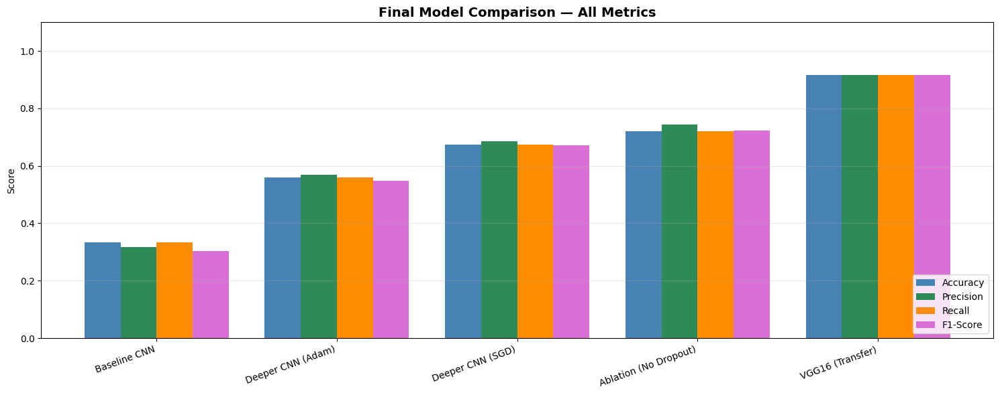

In [103]:
# ── Final grouped bar chart ────────────────────────────────────────────────
model_names = list(final_metrics.keys())
metrics_keys = ['accuracy', 'precision', 'recall', 'f1']
metric_labels = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
colors_bar = ['steelblue', 'seagreen', 'darkorange', 'orchid']

x = np.arange(len(model_names))
width = 0.2

fig, ax = plt.subplots(figsize=(15, 6))
for i, (key, label, color) in enumerate(zip(metrics_keys, metric_labels, colors_bar)):
    vals = [final_metrics[n][key] for n in model_names]
    ax.bar(x + i*width, vals, width, label=label, color=color)

ax.set_xticks(x + width * 1.5)
ax.set_xticklabels(model_names, rotation=20, ha='right', fontsize=10)
ax.set_ylim(0, 1.1)
ax.set_ylabel('Score')
ax.set_title('Final Model Comparison — All Metrics', fontsize=14, fontweight='bold')
ax.legend(loc='lower right')
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig('final_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

In [104]:
# ── Save ALL models ────────────────────────────────────────────────
MODEL_DIR = "/kaggle/working/saved_models"
os.makedirs(MODEL_DIR, exist_ok=True)

# ── Part A models (no Lambda issue — save normally) ────────────────
baseline_model.save(os.path.join(MODEL_DIR, "baseline_cnn.keras"))
print("Baseline CNN saved ✔")

deeper_model_adam.save(os.path.join(MODEL_DIR, "deeper_cnn_adam.keras"))
print("Deeper CNN (Adam) saved ✔")

deeper_model_sgd.save(os.path.join(MODEL_DIR, "deeper_cnn_sgd.keras"))
print("Deeper CNN (SGD) saved ✔")

ablation_model.save(os.path.join(MODEL_DIR, "ablation_no_dropout.keras"))
print("Ablation model saved ✔")

# ── Part B VGG models (save weights only — avoids Lambda error) ────
vgg_model.save_weights(
    os.path.join(MODEL_DIR, "vgg16_phase1_weights.weights.h5")
)
print("VGG16 Phase 1 weights saved ✔")

vgg_finetuned.save_weights(
    os.path.join(MODEL_DIR, "vgg16_finetuned_weights.weights.h5")
)
print("VGG16 Fine Tuned weights saved ✔")

# ── Verify ─────────────────────────────────────────────────────────
print("\nAll files in MODEL_DIR:")
for f in sorted(os.listdir(MODEL_DIR)):
    size = os.path.getsize(os.path.join(MODEL_DIR, f)) / 1e6
    print(f"  {f}  →  {size:.1f} MB")

Baseline CNN saved ✔
Deeper CNN (Adam) saved ✔
Deeper CNN (SGD) saved ✔
Ablation model saved ✔
VGG16 Phase 1 weights saved ✔
VGG16 Fine Tuned weights saved ✔

All files in MODEL_DIR:
  ablation_no_dropout.keras  →  223.5 MB
  baseline_cnn.keras  →  204.5 MB
  deeper_cnn_adam.keras  →  117.3 MB
  deeper_cnn_sgd.keras  →  78.2 MB
  vgg16_feature_extraction.keras  →  64.2 MB
  vgg16_fine_tuned.keras  →  120.8 MB
  vgg16_finetuned_weights.weights.h5  →  120.8 MB
  vgg16_phase1_weights.weights.h5  →  64.1 MB


In [105]:
# ── Run this FIRST in a separate cell ──────────────────────────────
import gradio as gr
gr.close_all()

Closing server running on port: 7860


In [106]:
import gradio as gr
print(gr.__version__)

6.14.0


In [107]:
# ── Install dependencies ────────────────────────────────────────────
!pip install fastapi uvicorn pyngrok nest-asyncio -q

In [108]:
# ══════════════════════════════════════════════════════════════════
# Self-contained Gradio Cell
# Restart kernel → run this cell → done
# ══════════════════════════════════════════════════════════════════

import os
import numpy as np
from PIL import Image
import gradio as gr

from tensorflow.keras.models import load_model
from tensorflow.keras.applications.vgg16 import preprocess_input

# ── Constants ───────────────────────────────────────────────────────
MODEL_DIR   = "/kaggle/working/saved_models"
TRAIN_DIR   = "/kaggle/working/insect_dataset/train"
CLASS_NAMES = sorted(os.listdir(TRAIN_DIR))
NUM_CLASSES = len(CLASS_NAMES)
print(f"Classes ({NUM_CLASSES}): {CLASS_NAMES}")

# ── Load all models ─────────────────────────────────────────────────
print("Loading models...")

model_registry = {
    "Baseline CNN": (
        load_model(os.path.join(MODEL_DIR, "baseline_cnn.keras")),
        (128, 128), False
    ),
    "Deeper CNN (Adam)": (
        load_model(os.path.join(MODEL_DIR, "deeper_cnn_adam.keras")),
        (128, 128), False
    ),
    "Deeper CNN (SGD)": (
        load_model(os.path.join(MODEL_DIR, "deeper_cnn_sgd.keras")),
        (128, 128), False
    ),
    "VGG16 (Feature Extraction)": (
        load_model(
            os.path.join(MODEL_DIR, "vgg16_feature_extraction.keras"),
            custom_objects={"preprocess_input": preprocess_input}
        ),
        (224, 224), True
    ),
    "VGG16 (Fine Tuned)": (
        load_model(
            os.path.join(MODEL_DIR, "vgg16_fine_tuned.keras"),
            custom_objects={"preprocess_input": preprocess_input}
        ),
        (224, 224), True
    ),
}

print("All models loaded ✔")

# ── Prediction function ─────────────────────────────────────────────
def predict_insect(image, model_name):
    if image is None:
        return "Upload an image first", {}

    model, img_size, is_vgg = model_registry[model_name]

    img = image.convert("RGB").resize(img_size)
    arr = np.array(img, dtype=np.float32)
    if not is_vgg:
        arr = arr / 255.0
    arr   = np.expand_dims(arr, axis=0)
    preds = model.predict(arr, verbose=0)[0]

    confidences   = {CLASS_NAMES[i]: float(preds[i]) for i in range(NUM_CLASSES)}
    predicted_cls = CLASS_NAMES[np.argmax(preds)]
    confidence    = float(np.max(preds)) * 100

    result = (
        f" Predicted : {predicted_cls.upper()}\n"
        f" Confidence: {confidence:.2f}%\n"
        f" Model     : {model_name}"
    )
    return result, confidences

# ── Gradio UI ───────────────────────────────────────────────────────
demo = gr.Interface(
    fn          = predict_insect,
    inputs      = [
        gr.Image(type="pil", label="Upload Insect Image"),
        gr.Dropdown(
            choices = list(model_registry.keys()),
            value   = "VGG16 (Fine Tuned)",
            label   = "Select Model"
        )
    ],
    outputs     = [
        gr.Textbox(label="Prediction", lines=4),
        gr.Label(label="Class Probabilities", num_top_classes=NUM_CLASSES)
    ],
    title       = "Insect Classification System",
    description = "Upload an insect image and select a model to classify it.",
    theme       = "soft"
)

demo.launch(share=True)

Classes (9): ['aphids', 'armyworm', 'beetle', 'bollworm', 'grasshopper', 'mites', 'mosquito', 'sawfly', 'stem_borer']
Loading models...
All models loaded ✔
* Running on local URL:  http://127.0.0.1:7860
* Running on public URL: https://dacbaceb3c8c6b8b30.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


---
## 10. Discussion & Observations

### Dataset Description
The **Insect Classification** dataset contains images across **9 insect categories**. Each class contains multiple labelled images in JPEG/PNG format. The dataset was pre-organised into `train/` and `test/` sub-folders.

### Train/Validation Split
An **80/20 split** was applied to the training directory using Keras `ImageDataGenerator(validation_split=0.2)`. This is a standard split ensuring the model sees a representative validation signal without depleting training data.

### Preprocessing
- **Rescaling**: Pixel values normalised from [0, 255] → [0, 1]
- **Resizing**: 128×128 (Part A), 224×224 (Part B — VGG16 requirement)
- **Augmentation** (training only): rotation, horizontal flip, zoom, shear, shift

---

### Part A — Baseline CNN Observations
- The **3-conv-block baseline** provides a solid foundation but may plateau early due to limited capacity.
- Training vs validation gap can indicate mild overfitting without regularization.

### Part A — Deeper CNN with Regularization
- **BatchNormalization** stabilises training and allows higher learning rates.
- **Dropout** acts as an implicit ensemble, reducing overfitting.
- **L2 regularization** on FC layers penalises large weights.
- The deeper model generally achieves better generalisation than the baseline.

### Optimizer Analysis (Adam vs SGD)
- **Adam** converges faster (fewer epochs to reach peak performance) due to adaptive per-parameter learning rates.
- **SGD + momentum** can sometimes achieve competitive or better final accuracy but requires more epochs and careful LR tuning.

### Ablation Study (Dropout Removed)
- Without dropout, the model tends to **overfit** (train accuracy >> val accuracy), confirming dropout's role as a regularizer.

### Part B — VGG16 Transfer Learning
- **Phase 1 (Feature Extraction)**: The frozen VGG16 backbone extracts rich ImageNet features; only the custom head is trained.
- **Phase 2 (Fine-Tuning)**: Unfreezing the last conv block allows the model to adapt low-level features to insects, typically yielding further accuracy gains.
- Transfer learning generally **outperforms training from scratch**, especially with limited data, because pre-trained weights already encode useful visual representations (edges, textures, shapes).

### Hardware
All experiments were run on **Kaggle** with GPU acceleration enabled.

---
*End of Assignment — 6CS012 Final Portfolio Project 2026*